In [71]:
import mne
import scipy
import numpy as np
import matplotlib.pyplot as plt
import utils
import algo
import os
import random
import glob
import copy
import itertools
import pandas as pd
from findpeaks import findpeaks
from tqdm import tqdm
from numpy import linalg as LA
from scipy.stats import zscore, pearsonr
from scipy.io import savemat, loadmat
from scipy import signal
%matplotlib widget

In [49]:
def clean_features(feats, smooth=True, objflow=True):
    y = copy.deepcopy(feats)
    if not objflow:
        # discard the coordinate of the center if it is not object detection based optical flow 
        y = y[:,:-2]
    else:
        # recover unnormalized histogram
        # TODO: remove in the future version
        # y[:,0:8] = y[:,0:8] * np.expand_dims(y[:,8], axis=1)
        pass
    # interpolate NaN values (linealy)
    T, nb_feature = y.shape
    for i in range(nb_feature):
        # interpolate NaN values
        nans, x= np.isnan(y[:,i]), lambda z: z.nonzero()[0]
        if any(nans):
            f1 = scipy.interpolate.interp1d(x(~nans), y[:,i][~nans], fill_value='extrapolate')
            y[:,i][nans] = f1(x(nans))
        if smooth:
            # extract envelope by finding peaks and interpolating peaks with spline
            idx_peaks = scipy.signal.find_peaks(y[:,i])[0]
            idx_rest = np.setdiff1d(np.array(range(T)), idx_peaks)
            # consider use quadratic instead
            f2 = scipy.interpolate.interp1d(idx_peaks, y[:,i][idx_peaks], kind='cubic', fill_value='extrapolate')
            y[:,i][idx_rest] = f2(idx_rest)
    return y

## Data Loading

In [58]:
def multisub_data_org(subjects, video_id, fsStim, bads, band=None, eog=False, regression=False, normalize=True, smooth=True, objflow=True):
    feats_path_folder = '../Feature extraction/features/'
    # if objflow:
    #     feats_path = feats_path_folder + video_id + '_mask.npy'
    # else:
    #     feats_path = feats_path_folder + video_id + '_flow.npy'
    
    objf = np.load(feats_path_folder + video_id + '_mask.npy')
    flow = np.load(feats_path_folder + video_id + '_flow.npy')
    flow_mag = np.expand_dims(flow[:,8], axis=1)
    tempctra = np.load(feats_path_folder + video_id + '_tempctra.npy')
    tc_mask = np.load(feats_path_folder + video_id + '_tcmask.npy')
    feats = np.concatenate((objf, tempctra, flow_mag, tc_mask), axis=1)
    feats = clean_features(feats, smooth=smooth, objflow=objflow)
    T = feats.shape[0]
    eeg_list = []
    hf_list = []
    eog_list = []
    N = len(subjects)
    for n in range(N):
        eeg_path = '../../Experiments/data/'+ subjects[n] +'/' + video_id + '_eeg.set'
        eeg_prepro, fs, high_freq = utils.preprocessing(eeg_path, HP_cutoff = 0.5, AC_freqs=50, band=band, resamp_freqs=fsStim, bads=bads[n], eog=eog, regression=regression, normalize=normalize)
        eeg_channel_indices = mne.pick_types(eeg_prepro.info, eeg=True)
        eog_channel_indices = mne.pick_types(eeg_prepro.info, eog=True)
        eeg_downsampled, _ = eeg_prepro[eeg_channel_indices]
        eog_downsampled, _ = eeg_prepro[eog_channel_indices]
        eeg_downsampled = eeg_downsampled.T
        eog_downsampled = eog_downsampled.T
        eeg_list.append(eeg_downsampled)
        eog_list.append(eog_downsampled)
        if eeg_downsampled.shape[0] < T:
            T = eeg_downsampled.shape[0]
        hf_indices = mne.pick_types(high_freq.info, eeg=True)
        hf_downsampled, _ = high_freq[hf_indices]
        hf_downsampled = hf_downsampled.T
        hf_list.append(hf_downsampled)
        if hf_downsampled.shape[0] < T:
            T = hf_downsampled.shape[0] 
    # Clip data
    feats = feats[fsStim:T-fsStim, :]
    eeg_list = [np.expand_dims(eeg[fsStim:T-fsStim,:], axis=2) for eeg in eeg_list]
    eog_list = [np.expand_dims(eog[fsStim:T-fsStim,:], axis=2) for eog in eog_list]
    hf_list = [np.expand_dims(eeg[fsStim:T-fsStim,:], axis=2) for eeg in hf_list]
    eeg_multisub = np.concatenate(tuple(eeg_list), axis=2)
    eog_multisub = np.concatenate(tuple(eog_list), axis=2)
    hf_multisub = np.concatenate(tuple(hf_list), axis=2)
    times = np.array(range(T))/fs
    return feats, eeg_multisub, eog_multisub, hf_multisub, fs, times

In [60]:
%%capture
subjects = ['AS', 'YY', 'CM', 'SUB1', 'IR', 'SUB2', 'YZ', 'WD', 'CC', 'CW', 'WS', 'VC','HV','JC','DV','CD','JV','KY']
bads = [[], ['B25'], ['A24'], ['B25'], ['B25'], ['B25'], ['A11','B7','B25'], ['B25','B31'], ['B25'], [], ['A1','A30','B25'], ['B25','B31'], ['B25','B31','A20','A21','A26','A31'], ['B25','B31','B32','A28','A29','A30'],['A25','A30','B25','B29'],['A30','B25','B31'],['A30','B25'],[]]
eeg_path_folder = "../../Experiments/data/CD/"
video_ids = [dataset[0:2] for dataset in os.listdir(eeg_path_folder) if dataset.endswith('.set')]
video_ids.remove('Mr')
features_list = []
eeg_multisub_list = []
eog_multisub_list = []
hf_multisub_list = []
for video_id in video_ids:
    features, eeg_multisub, eog_multisub, hf_multisub, fs, _ = multisub_data_org(subjects, video_id, fsStim=30, bads=bads, band=[25,35], eog=True, regression=True, normalize=True, smooth=True, objflow=True)
    features_list.append(features) 
    eeg_multisub_list.append(eeg_multisub)
    eog_multisub_list.append(eog_multisub)
    hf_multisub_list.append(hf_multisub)
feature_concat = np.concatenate(tuple(features_list), axis=0)
# feature_concat = feature_concat/LA.norm(feature_concat)
eeg_multisub_concat = np.concatenate(tuple(eeg_multisub_list), axis=0)
eog_multisub_concat = np.concatenate(tuple(eog_multisub_list), axis=0)
hf_multisub_concat = np.concatenate(tuple(hf_multisub_list), axis=0)
T = feature_concat.shape[0]
times = np.array(range(T))/fs

In [61]:
bio32 = mne.channels.make_standard_montage('biosemi32')
bio64 = mne.channels.make_standard_montage('biosemi64')
downsample_ind = [ch in bio32.ch_names for ch in bio64.ch_names]
# complem_ind = [ch not in bio32.ch_names for ch in bio64.ch_names]

In [62]:
eeg_32_list = [eeg64[:,downsample_ind,:] for eeg64 in eeg_multisub_list]
hf_32_list = [hf64[:,downsample_ind,:] for hf64 in hf_multisub_list]
mix_64_list = [np.concatenate((eeg32, hf32), axis=1) for eeg32, hf32 in zip(eeg_32_list, hf_32_list)]

In [63]:
eeg_32 = eeg_multisub_concat[:,downsample_ind,:]
hf_32 = hf_multisub_concat[:,downsample_ind,:]
mix_64 = np.concatenate((eeg_32, hf_32), axis=1)
mix_128 = np.concatenate((eeg_multisub_concat,hf_multisub_concat), axis=1)

In [64]:
hist = feature_concat[:,0:8]
mag_sum = np.sum(hist, axis=1, keepdims=True)
mag_avg = np.expand_dims(feature_concat[:,8], axis=1)
mag_up = np.expand_dims(feature_concat[:,9], axis=1)
mag_down = np.expand_dims(feature_concat[:,10], axis=1)
mag_left = np.expand_dims(feature_concat[:,11], axis=1)
mag_right = np.expand_dims(feature_concat[:,12], axis=1)
mag_all = feature_concat[:,8:13]
center = feature_concat[:,13:15]
box_size = feature_concat[:, 15:17]
mutempctra = np.expand_dims(feature_concat[:, 17], axis=1)
muSqtempctra = np.expand_dims(feature_concat[:, 18], axis=1)
flow_mag_avg = np.expand_dims(feature_concat[:, 19], axis=1)

In [65]:
dt = times[1]-times[0]
acc = np.gradient(mag_avg, dt, axis=0)
acc_all = np.gradient(mag_all, dt, axis=0)

In [66]:
hist_norm = hist/mag_sum
hist_avg = hist_norm*mag_avg

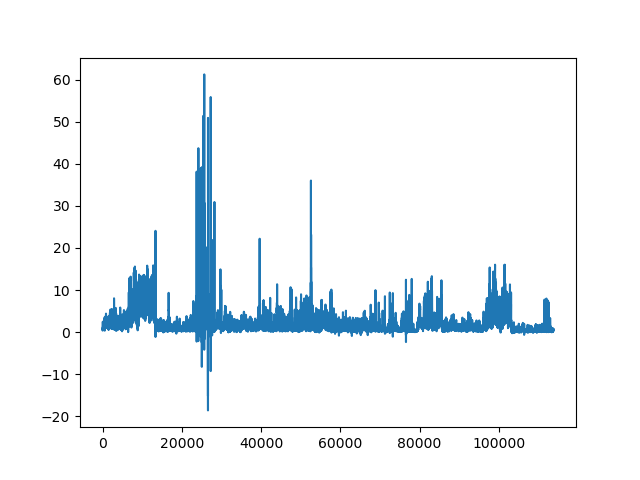

In [67]:
plt.close()
plt.plot(mutempctra)
plt.show()

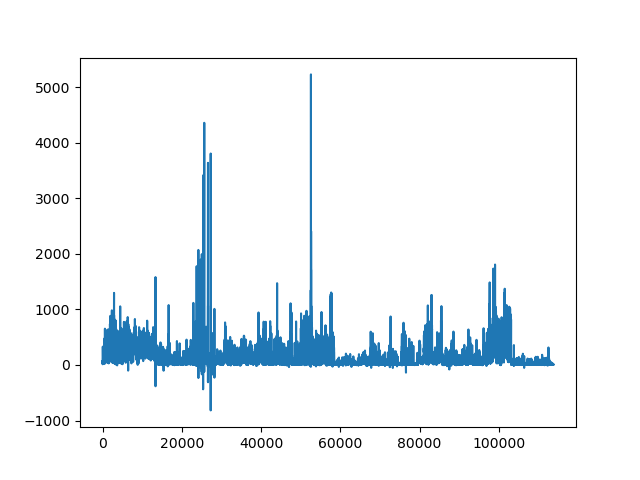

In [68]:
plt.close()
plt.plot(muSqtempctra)
plt.show()

## CCA

In [69]:
eeg_multisub_concat.shape[0]/30/60

63.193888888888885

In [ ]:
n_components = 5
L_EEG = 3 # correlations can be higher if include time lags
L_Stim = int(fs/2)
cc = np.zeros((len(subjects), n_components+1))
mask_tempctra_list = [feats[:,21] for feats in features_list]
for id_sub in range(len(subjects)):
    print('subject: ', subjects[id_sub])
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mask_tempctra_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=True, n_components=n_components)
    _, corr_test, sig_corr, _, _, _, _, V_A_train, V_B_train = CCA.cross_val()
    cc[id_sub,:n_components] = np.average(corr_test, axis=0)
    cc[id_sub,-1] = sig_corr
    eeg_onesub = np.concatenate(tuple(eeg_onesub_list), axis=0)
    forward_model = CCA.forward_model(eeg_onesub, V_A_train)
    utils.plot_spatial_resp(forward_model, corr_test, 'CCA/SR_masktemp_'+subjects[id_sub])
df_cca = pd.DataFrame(cc, columns = ['CC1','CC2','CC3','CC4','CC5','Sig_corr'])
df_cca.to_csv('tables/CCA/masktemp_eeg.csv', index=True)

subject:  AS


100%|██████████| 1000/1000 [01:08<00:00, 14.49it/s]


Significance level: 0.01671726043515851
Average correlation coefficients of the top 5 components on the training sets: [0.10067023 0.07560768 0.06723157 0.05863395 0.0526266 ]
Average correlation coefficients of the top 5 components on the test sets: [0.03714084 0.01702191 0.00684545 0.00969853 0.00653   ]
subject:  YY


100%|██████████| 1000/1000 [01:12<00:00, 13.72it/s]


Significance level: 0.016987333763413055
Average correlation coefficients of the top 5 components on the training sets: [0.11880198 0.08077701 0.06418608 0.05805042 0.05447639]
Average correlation coefficients of the top 5 components on the test sets: [ 0.06861723  0.02767192  0.00432778 -0.00175518  0.01384014]
subject:  CM


100%|██████████| 1000/1000 [01:07<00:00, 14.79it/s]


Significance level: 0.017972686377302743
Average correlation coefficients of the top 5 components on the training sets: [0.09473664 0.08040081 0.07114205 0.06096894 0.05712202]
Average correlation coefficients of the top 5 components on the test sets: [0.01656178 0.02997047 0.00579426 0.00349417 0.01115114]
subject:  SUB1


100%|██████████| 1000/1000 [01:10<00:00, 14.13it/s]


Significance level: 0.016199413080155114
Average correlation coefficients of the top 5 components on the training sets: [0.11614243 0.07346514 0.0696284  0.05678151 0.05394631]
Average correlation coefficients of the top 5 components on the test sets: [0.07041238 0.01212648 0.02549394 0.00950376 0.01264677]
subject:  IR


100%|██████████| 1000/1000 [01:10<00:00, 14.21it/s]


Significance level: 0.01674655685387523
Average correlation coefficients of the top 5 components on the training sets: [0.12283656 0.08625085 0.07102103 0.06880868 0.05621523]
Average correlation coefficients of the top 5 components on the test sets: [0.07809629 0.02290299 0.01563963 0.02279817 0.0012129 ]
subject:  SUB2


100%|██████████| 1000/1000 [01:06<00:00, 14.98it/s]


Significance level: 0.01527858405805267
Average correlation coefficients of the top 5 components on the training sets: [0.1053926  0.08512937 0.07322515 0.06307702 0.05717689]
Average correlation coefficients of the top 5 components on the test sets: [0.05464204 0.03664779 0.01827655 0.02563517 0.00812966]
subject:  YZ


100%|██████████| 1000/1000 [01:04<00:00, 15.56it/s]


Significance level: 0.01676227136723194
Average correlation coefficients of the top 5 components on the training sets: [0.09715007 0.09154521 0.06744738 0.05484957 0.04956783]
Average correlation coefficients of the top 5 components on the test sets: [ 0.04243141  0.04413972  0.00450556 -0.00451101  0.00092819]
subject:  WD


100%|██████████| 1000/1000 [01:08<00:00, 14.66it/s]


Significance level: 0.021320407480582358
Average correlation coefficients of the top 5 components on the training sets: [0.09857368 0.06763151 0.06295649 0.05467385 0.04939066]
Average correlation coefficients of the top 5 components on the test sets: [0.0364933  0.00315473 0.01279032 0.00161282 0.00863104]
subject:  CC


100%|██████████| 1000/1000 [01:07<00:00, 14.92it/s]


Significance level: 0.01624204284686393
Average correlation coefficients of the top 5 components on the training sets: [0.12794888 0.08835007 0.06587184 0.05411145 0.05058253]
Average correlation coefficients of the top 5 components on the test sets: [ 0.08618924  0.04474708 -0.00228189  0.00850581  0.00510491]
subject:  CW


100%|██████████| 1000/1000 [01:08<00:00, 14.70it/s]


Significance level: 0.0199673924174641
Average correlation coefficients of the top 5 components on the training sets: [0.11135662 0.08370537 0.06242621 0.05772252 0.05456144]
Average correlation coefficients of the top 5 components on the test sets: [ 0.06721557  0.0313543  -0.01503782  0.00906697  0.00084474]
subject:  WS


100%|██████████| 1000/1000 [01:07<00:00, 14.84it/s]


Significance level: 0.014758102480730962
Average correlation coefficients of the top 5 components on the training sets: [0.10212673 0.07302813 0.06688429 0.05883776 0.05533596]
Average correlation coefficients of the top 5 components on the test sets: [0.05027377 0.02617862 0.02581369 0.00100554 0.01817601]
subject:  VC


100%|██████████| 1000/1000 [01:06<00:00, 14.96it/s]


Significance level: 0.021610520599973853
Average correlation coefficients of the top 5 components on the training sets: [0.08653164 0.07253563 0.06177682 0.05625072 0.05261375]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01779714  0.01078941 -0.00228184 -0.00302585  0.00587749]
subject:  HV


100%|██████████| 1000/1000 [01:08<00:00, 14.64it/s]


Significance level: 0.016331749039876595
Average correlation coefficients of the top 5 components on the training sets: [0.08916686 0.07450125 0.06257388 0.0524218  0.04895405]
Average correlation coefficients of the top 5 components on the test sets: [ 0.02982637  0.02350974  0.00489882 -0.00161034 -0.00021654]
subject:  JC


100%|██████████| 1000/1000 [01:03<00:00, 15.73it/s]


Significance level: 0.01902092396221126
Average correlation coefficients of the top 5 components on the training sets: [0.07245291 0.06765805 0.06430697 0.05065576 0.04840655]
Average correlation coefficients of the top 5 components on the test sets: [-3.59783054e-03  6.17836821e-03  2.68855119e-02 -9.00063681e-05
  5.41810508e-03]
subject:  DV


100%|██████████| 1000/1000 [01:01<00:00, 16.31it/s]


Significance level: 0.016905447286870243
Average correlation coefficients of the top 5 components on the training sets: [0.11454008 0.08116118 0.06282925 0.05854697 0.05373451]
Average correlation coefficients of the top 5 components on the test sets: [ 0.07097284  0.03065333 -0.01316786  0.0146874   0.00365408]
subject:  CD


100%|██████████| 1000/1000 [01:05<00:00, 15.30it/s]


Significance level: 0.019613546014834844
Average correlation coefficients of the top 5 components on the training sets: [0.10519199 0.08304247 0.06596298 0.0599602  0.05483126]
Average correlation coefficients of the top 5 components on the test sets: [ 0.03822568  0.03454935 -0.00675679 -0.00147042 -0.00037838]
subject:  JV


100%|██████████| 1000/1000 [01:01<00:00, 16.23it/s]


Significance level: 0.016038497767082625
Average correlation coefficients of the top 5 components on the training sets: [0.11431852 0.09605861 0.06582215 0.05655089 0.05396121]
Average correlation coefficients of the top 5 components on the test sets: [ 0.06325551  0.05881891  0.00477432 -0.00513601  0.01448785]
subject:  KY


100%|██████████| 1000/1000 [00:59<00:00, 16.90it/s]


Significance level: 0.023858536963135127
Average correlation coefficients of the top 5 components on the training sets: [0.08850089 0.08285269 0.06854379 0.06025989 0.05717726]
Average correlation coefficients of the top 5 components on the test sets: [0.02468585 0.02675339 0.00808892 0.00668943 0.02153937]


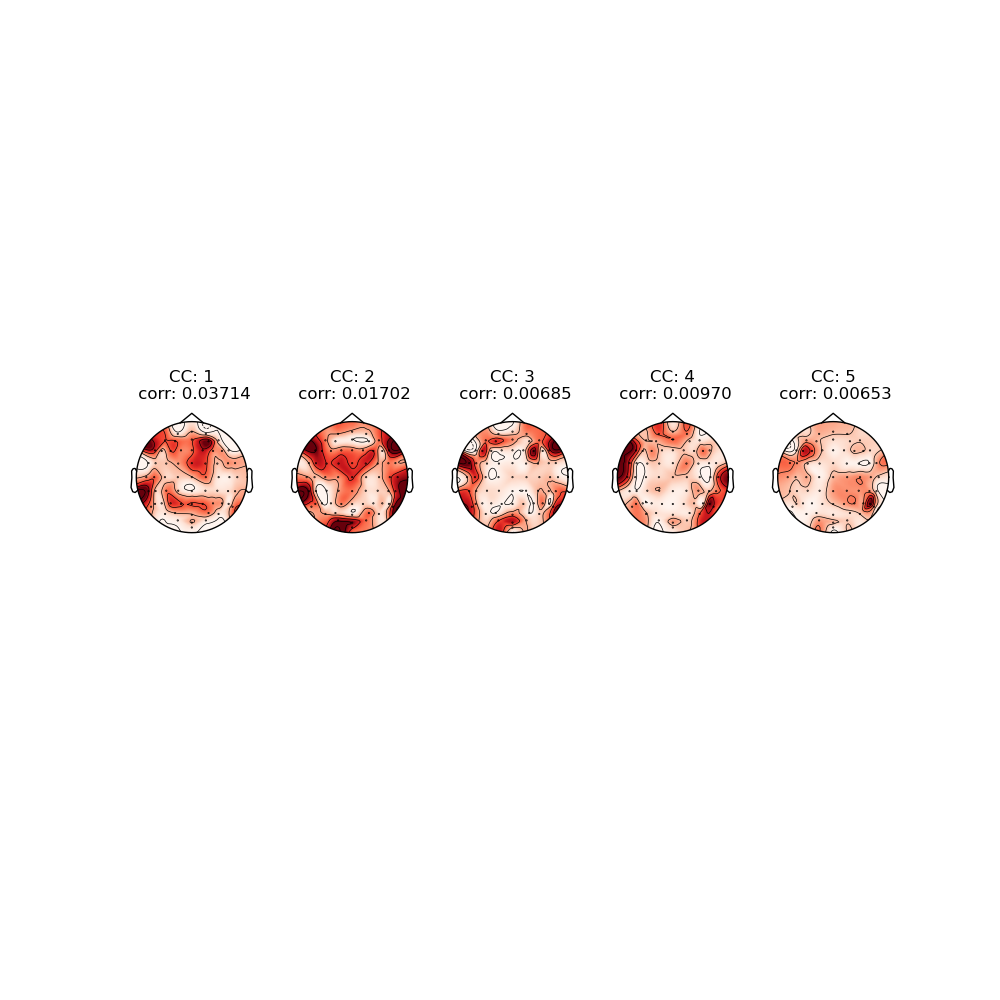

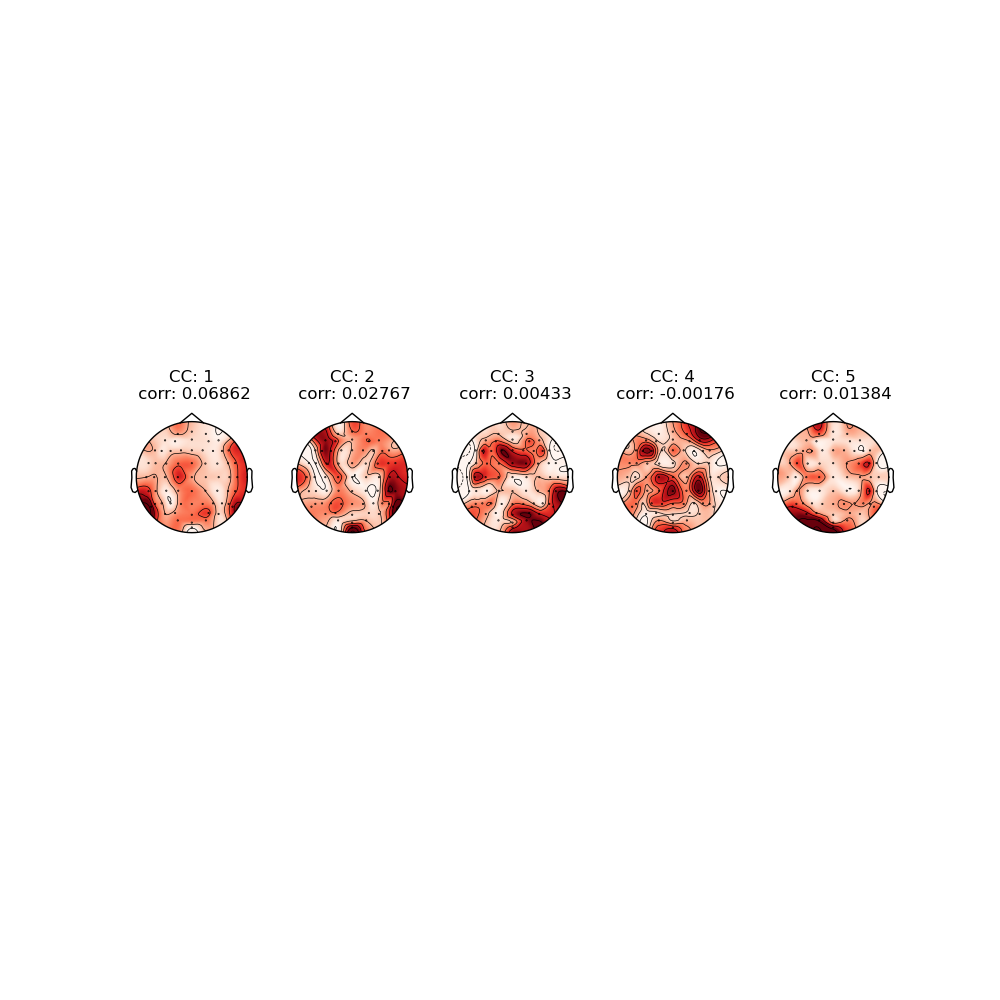

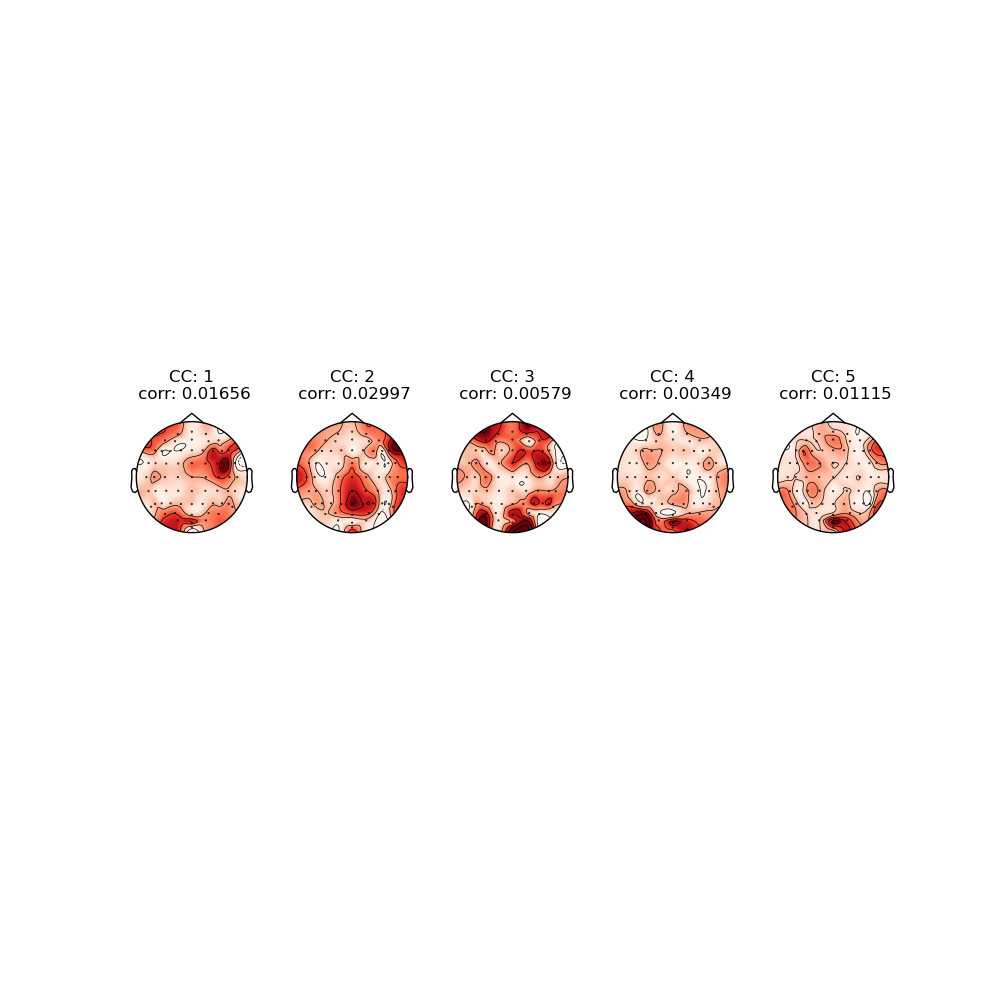

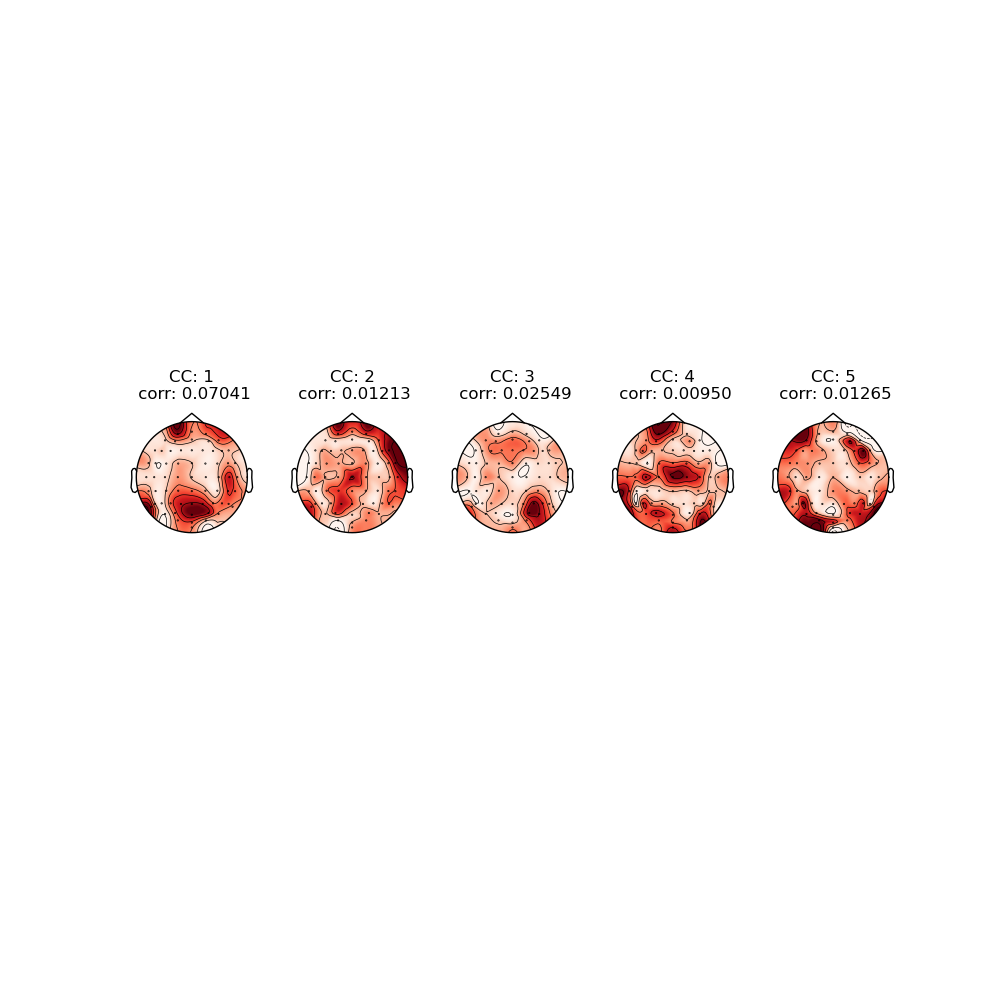

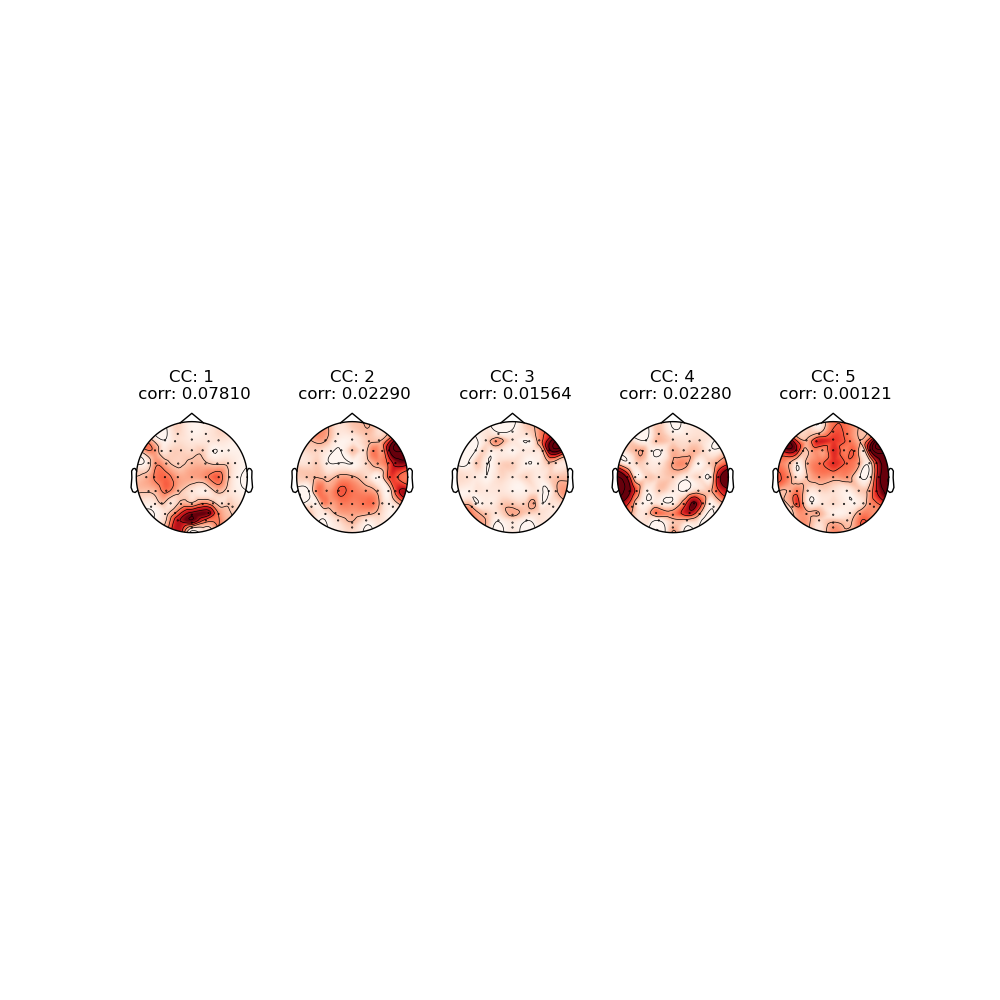

...

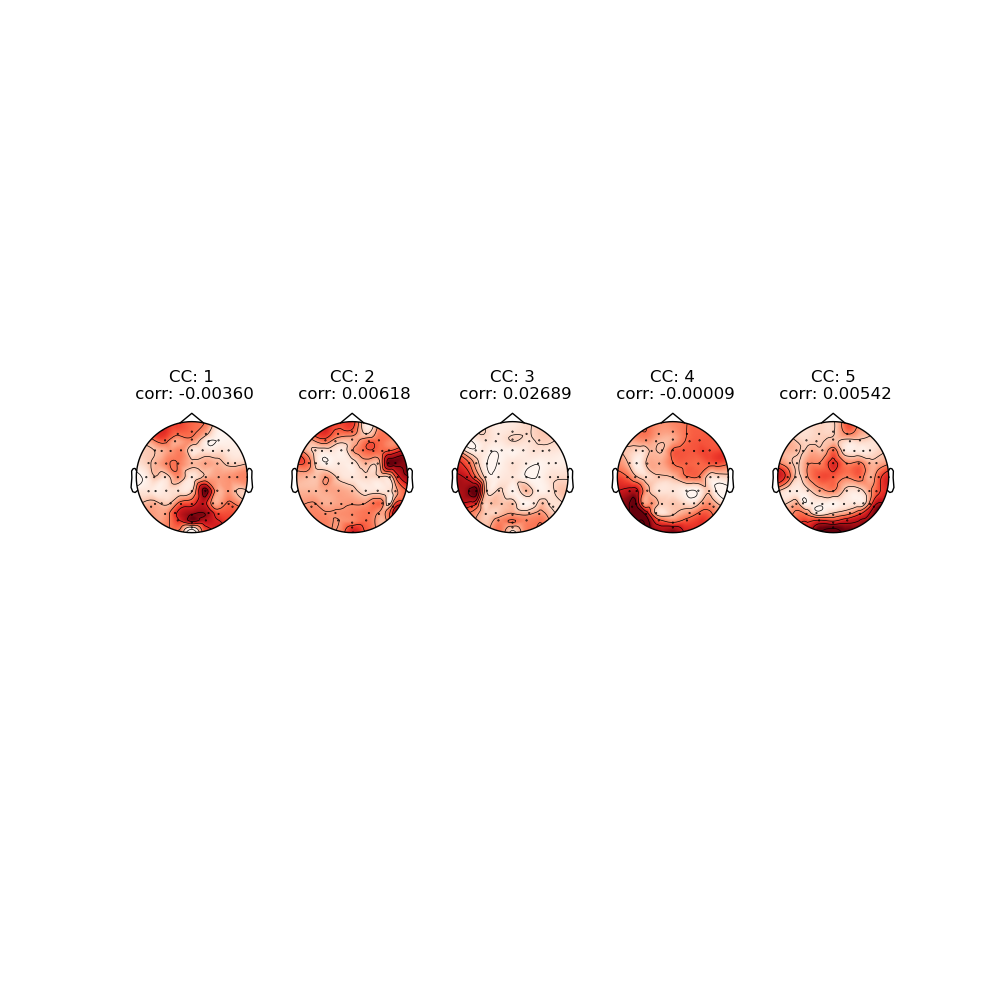

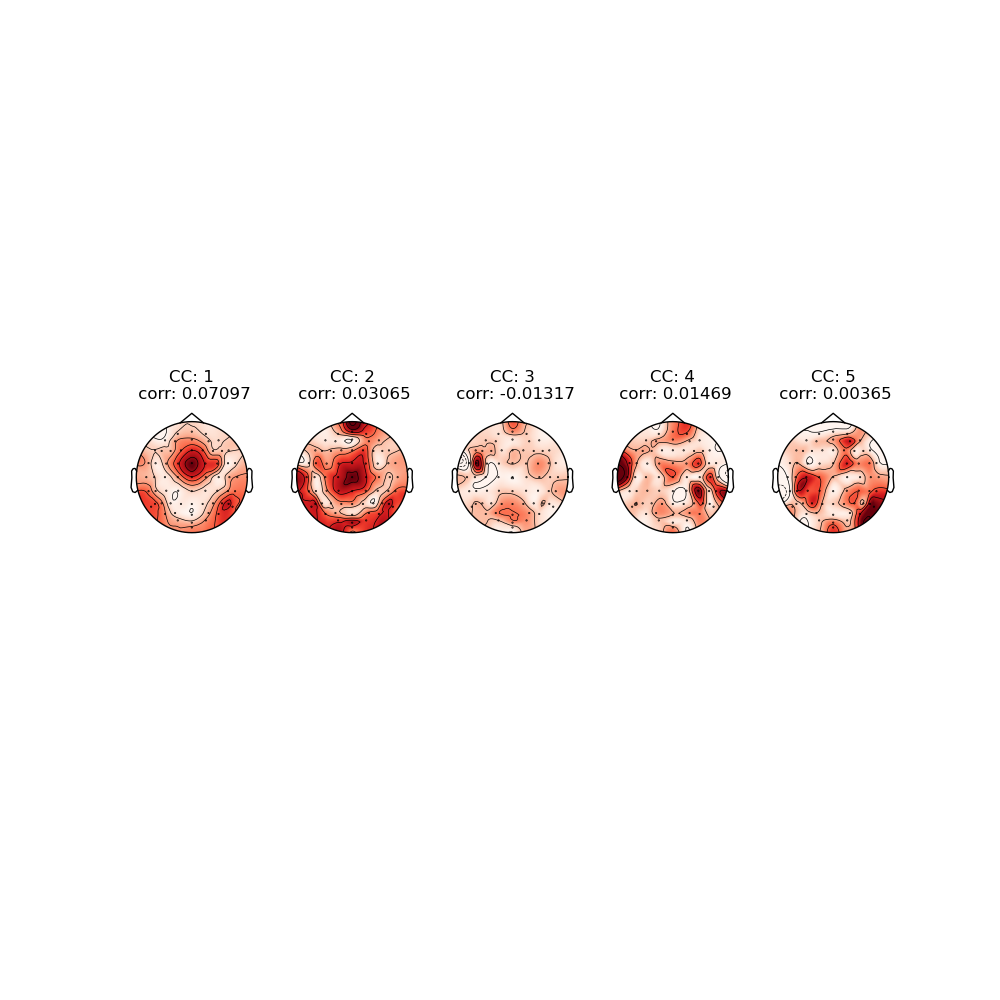

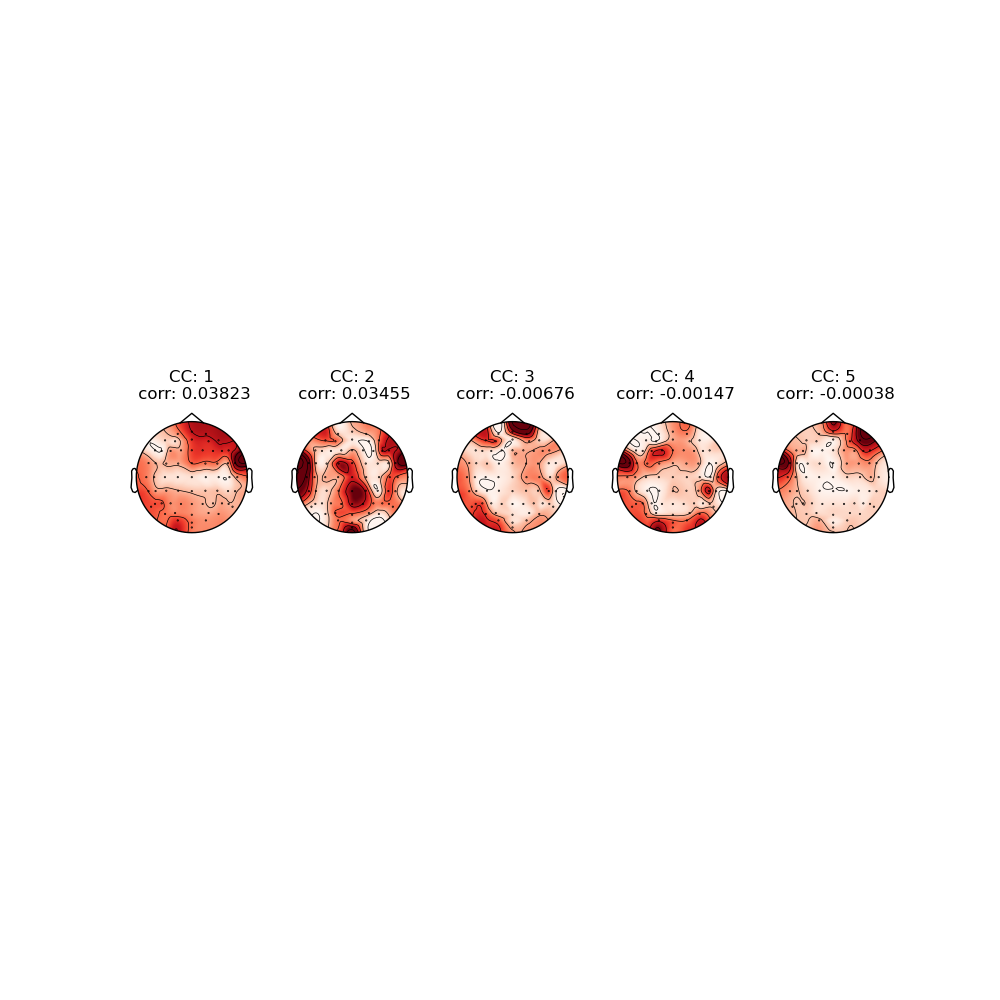

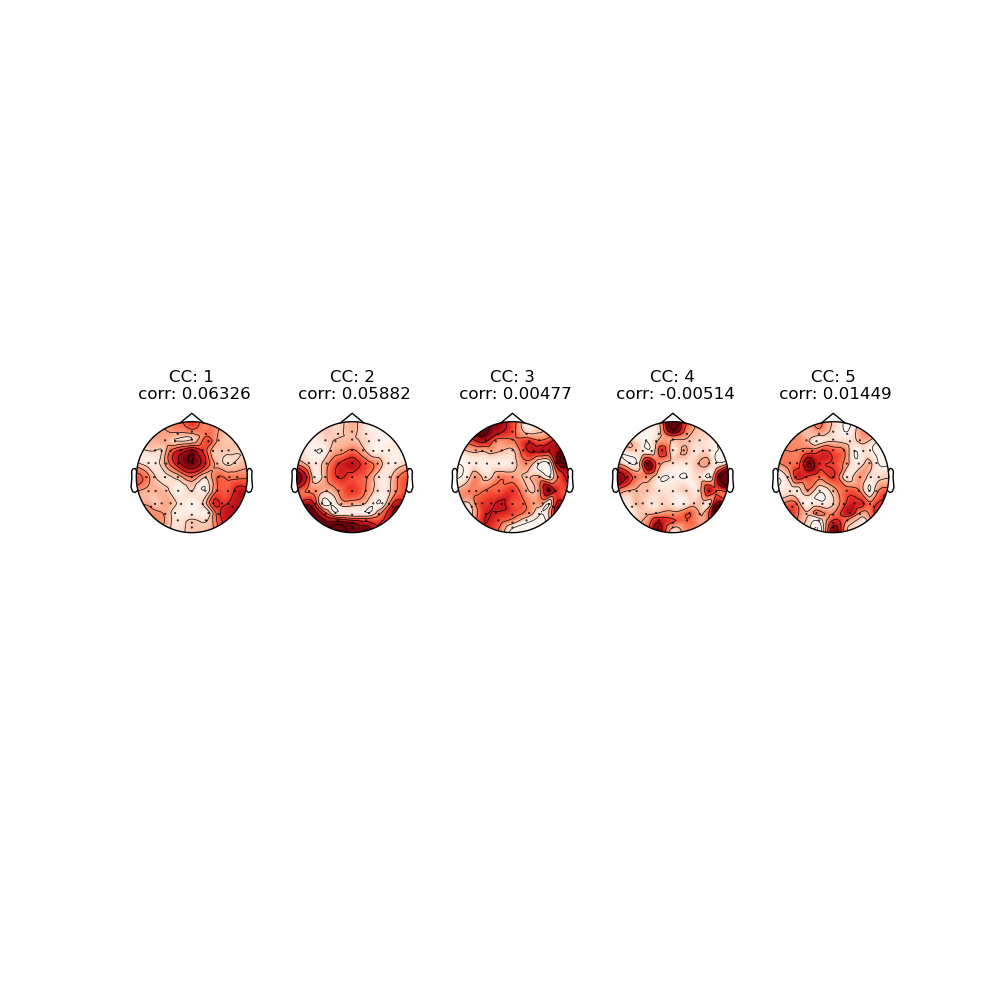

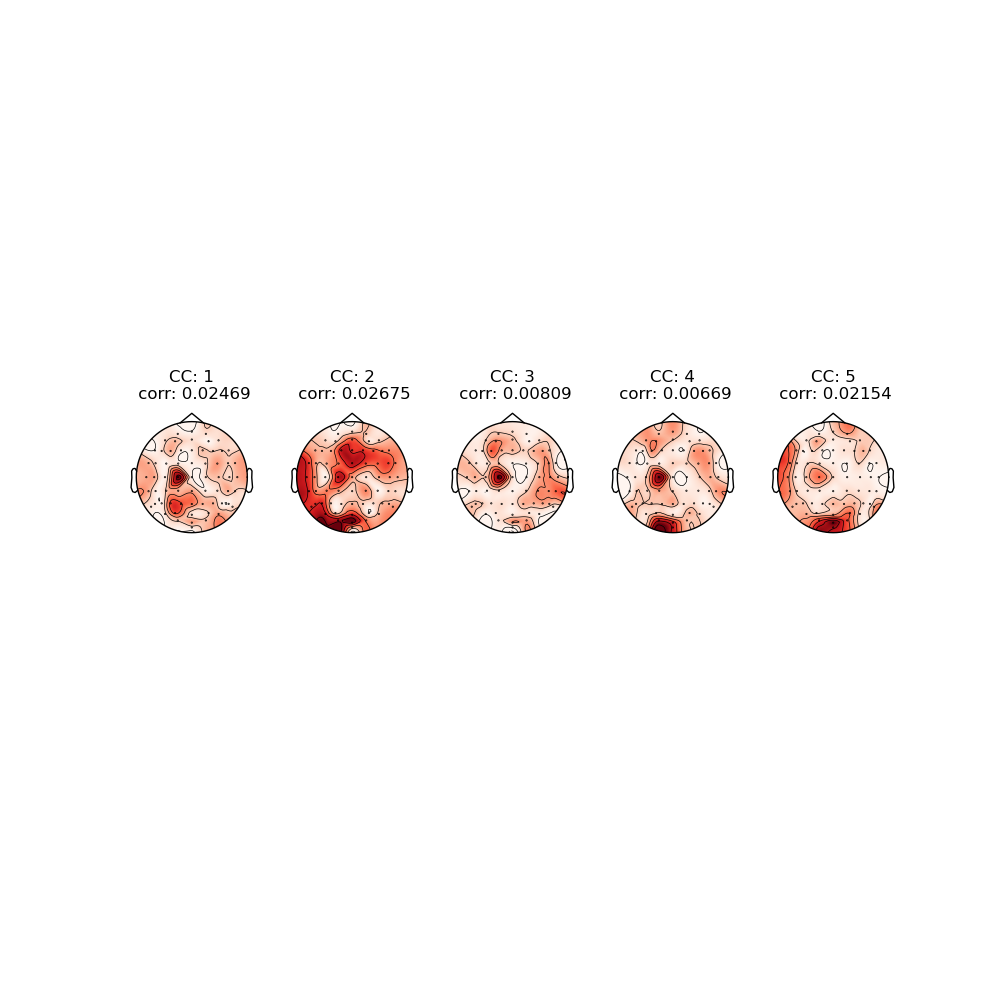

In [73]:
n_components = 5
L_EEG = 3 # correlations can be higher if include time lags
L_Stim = int(fs/2)
cc = np.zeros((len(subjects), n_components+1))
objflow_list = [feats[:,8] for feats in features_list]
mask_tempctra_list = [feats[:,21] for feats in features_list]
objflowtemp_list = [np.stack((objflow, objtemp), axis=1) for objflow, objtemp in zip(objflow_list, mask_tempctra_list)]
for id_sub in range(len(subjects)):
    print('subject: ', subjects[id_sub])
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, objflowtemp_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=True, n_components=n_components)
    _, corr_test, sig_corr, _, _, _, _, V_A_train, V_B_train = CCA.cross_val()
    cc[id_sub,:n_components] = np.average(corr_test, axis=0)
    cc[id_sub,-1] = sig_corr
    eeg_onesub = np.concatenate(tuple(eeg_onesub_list), axis=0)
    forward_model = CCA.forward_model(eeg_onesub, V_A_train)
    utils.plot_spatial_resp(forward_model, corr_test, 'CCA/SR_objflowtemp_'+subjects[id_sub])
df_cca = pd.DataFrame(cc, columns = ['CC1','CC2','CC3','CC4','CC5','Sig_corr'])
df_cca.to_csv('tables/CCA/objflowtemp_eeg.csv', index=True)

In [14]:
for id_sub in range(len(subjects)):
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
    mag_avg_list = [feats[:,8] for feats in features_list]
    center_list = [feats[:,13:15] for feats in features_list]
    mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
    muSqtempctra_list = [feats[:,18]/LA.norm(feats[:,18], axis=0) for feats in features_list]
    L_EEG = 3 # correlations can be higher if include time lags
    L_Stim = int(fs/2)
    CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=False)
    corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

Average correlation coefficients of the top 5 components on the training sets: [0.0942248  0.06754642 0.04482768 0.04176783 0.04021171]
Average correlation coefficients of the top 5 components on the test sets: [ 0.03722604  0.02545392 -0.00053083  0.00277158  0.00898263]
Average correlation coefficients of the top 5 components on the training sets: [0.10730539 0.07192018 0.05165059 0.04447425 0.04156685]
Average correlation coefficients of the top 5 components on the test sets: [0.06107162 0.02169914 0.01573233 0.00922956 0.00951017]
Average correlation coefficients of the top 5 components on the training sets: [0.08639373 0.07553436 0.0512909  0.04933011 0.04124949]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01914788  0.03893969  0.00556945  0.01741084 -0.00053143]
Average correlation coefficients of the top 5 components on the training sets: [0.10738481 0.06564549 0.05048556 0.04598834 0.04144895]
Average correlation coefficients of the top 5 comp

In [ ]:
for id_sub in range(len(subjects)):
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
    mag_avg_list = [feats[:,8] for feats in features_list]
    center_list = [feats[:,13:15] for feats in features_list]
    mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
    muSqtempctra_list = [feats[:,18] for feats in features_list]
    L_EEG = 3 # correlations can be higher if include time lags
    L_Stim = int(fs/2)
    CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, muSqtempctra_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=True)
    corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

In [ ]:
for id_sub in range(len(subjects)):
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
    mag_avg_list = [feats[:,8] for feats in features_list]
    center_list = [feats[:,13:15] for feats in features_list]
    mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
    muSqtempctra_list = [feats[:,18] for feats in features_list]
    L_EEG = 3 # correlations can be higher if include time lags
    L_Stim = int(fs/2)
    CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mutempctra_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=True)
    corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

In [ ]:
for id_sub in range(len(subjects)):
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
    mag_avg_list = [feats[:,8] for feats in features_list]
    center_list = [feats[:,13:15] for feats in features_list]
    mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
    muSqtempctra_list = [feats[:,18] for feats in features_list]
    flow_mag_list = [feats[:,19] for feats in features_list]
    L_EEG = 3 # correlations can be higher if include time lags
    L_Stim = int(fs/2)
    CCA = algo.CanonicalCorrelationAnalysis(eog_onesub_list, flow_mag_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=True)
    corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

In [ ]:
for id_sub in range(len(subjects)):
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
    mag_avg_list = [feats[:,8] for feats in features_list]
    center_list = [feats[:,13:15] for feats in features_list]
    mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
    muSqtempctra_list = [feats[:,18] for feats in features_list]
    merge_list = [np.stack((mag_avg, muSqtempctra), axis=1) for mag_avg, muSqtempctra in zip(mag_avg_list, muSqtempctra_list)]
    L_EEG = 3 # correlations can be higher if include time lags
    L_Stim = int(fs/2)
    CCA = algo.CanonicalCorrelationAnalysis(eog_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG=1, offset_Stim=0, signifi_level=True)
    corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

In [14]:
id_sub = 12
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 3 # correlations can be higher if include time lags
offset_EEG = 1
L_Stim = int(fs/2)
offset_Stim = 0
CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG, offset_Stim)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

100%|██████████| 1000/1000 [00:47<00:00, 21.19it/s]

Significance level: 0.018273787942761004
Average correlation coefficients of the top 5 components on the training sets: [0.08321975 0.06197934 0.04356021 0.04032331 0.03893044]
Average correlation coefficients of the top 5 components on the test sets: [ 0.0312349   0.01714943  0.00438287 -0.00374258 -0.00028059]


In [13]:
id_sub = 14
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 3 # correlations can be higher if include time lags
offset_EEG = 1
L_Stim = int(fs/2)
offset_Stim = 0
CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG, offset_Stim)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

100%|██████████| 1000/1000 [00:45<00:00, 21.97it/s]

Significance level: 0.017046870139890563
Average correlation coefficients of the top 5 components on the training sets: [0.10986678 0.07179998 0.0494876  0.04707922 0.04206518]
Average correlation coefficients of the top 5 components on the test sets: [0.06944894 0.03353104 0.00388581 0.01437636 0.00576556]


In [20]:
id_sub = 5
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
hist_list = [feats[:,:8] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
offset_EEG = 4
L_Stim = int(fs/2)
offset_Stim = 0
CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG, offset_Stim)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

100%|██████████| 1000/1000 [00:56<00:00, 17.71it/s]

Significance level: 0.013810239336936472
Average correlation coefficients of the top 5 components on the training sets: [0.11920794 0.1060024  0.09614602 0.09202846 0.08763355]
Average correlation coefficients of the top 5 components on the test sets: [ 0.04963018  0.02739852 -0.00810272  0.00281353  0.02360709]


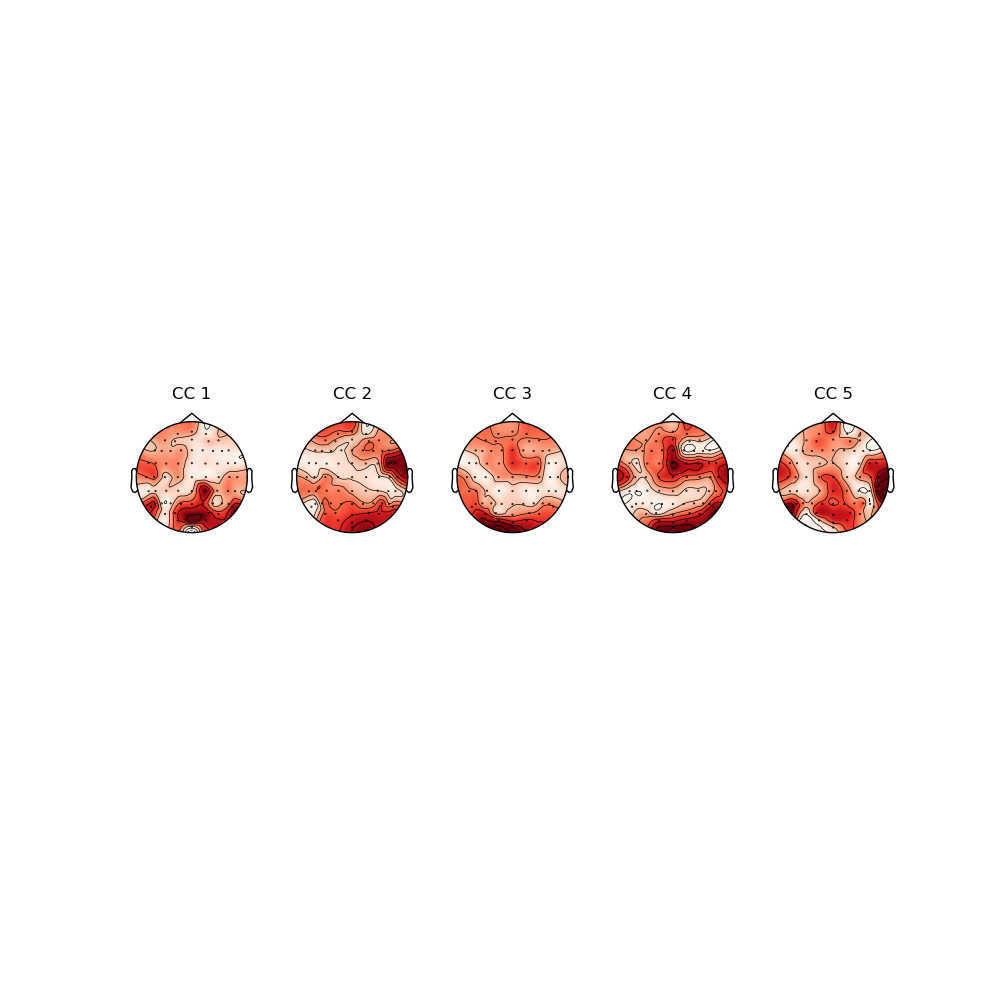

In [14]:
# Visualization: spatial (temporal) filter
eeg_onesub = np.concatenate(tuple(eeg_onesub_list), axis=0)
forward_model = CCA.forward_model(eeg_onesub, V_A_train)
# forward_model = utils.forward_model(eeg_onesub, V_A_train, L_EEG, offset=1)
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    mne.viz.plot_topomap(np.abs(forward_model[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()
# plt.savefig('figures/CCA_'+str(id_sub)+'.png')

In [271]:
id_sub = 12
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
offset_EEG = 4
L_Stim = int(fs/2)
offset_Stim = 0
SICorrCA = algo.StimulusInformedCorrCA([eeg_onesub_list, mag_avg_list], fs, [L_EEG, L_Stim], [offset_EEG, offset_Stim])
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, Wlist_train, F_train = SICorrCA.cross_val(rho=1, signifi_level=False)

Average ISC of the top 5 components on the training sets: [0.08447363 0.06376869 0.04343511 0.03982063 0.03810143]
Average ISC of the top 5 components on the test sets: [ 0.03444862  0.0206575   0.00506695 -0.00161569 -0.00171014]


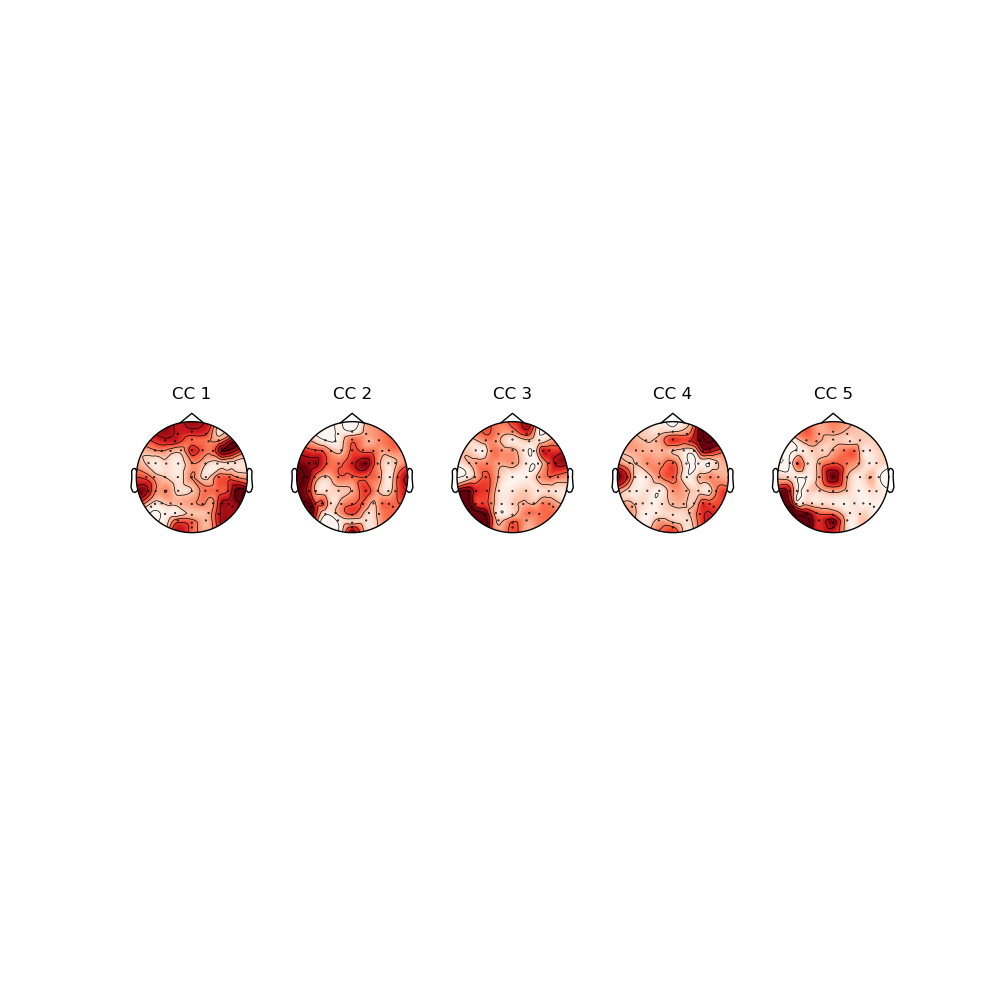

In [273]:
# Visualization: spatial (temporal) filter
eeg_onesub = np.concatenate(tuple(eeg_onesub_list), axis=0)
forward_model = SICorrCA.forward_model(eeg_onesub, Wlist_train)
# forward_model = utils.forward_model(eeg_onesub, V_A_train, L_EEG, offset=1)
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    mne.viz.plot_topomap(np.abs(forward_model[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()
# plt.savefig('figures/CCA_'+str(id_sub)+'.png')

In [279]:
id_sub = 12
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
offset_EEG = 4
L_Stim = int(fs/2)
offset_Stim = 0
SIGCCA = algo.StimulusInformedGCCA([eeg_onesub_list, mag_avg_list], fs, [L_EEG, L_Stim], [offset_EEG, offset_Stim])
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, Wlist_train, F_train = SIGCCA.cross_val(rho=1, signifi_level=False)

Average ISC of the top 5 components on the training sets: [0.08447363 0.06376869 0.04343511 0.03982063 0.03810143]
Average ISC of the top 5 components on the test sets: [ 0.03444862  0.0206575   0.00506695 -0.00161569 -0.00171014]


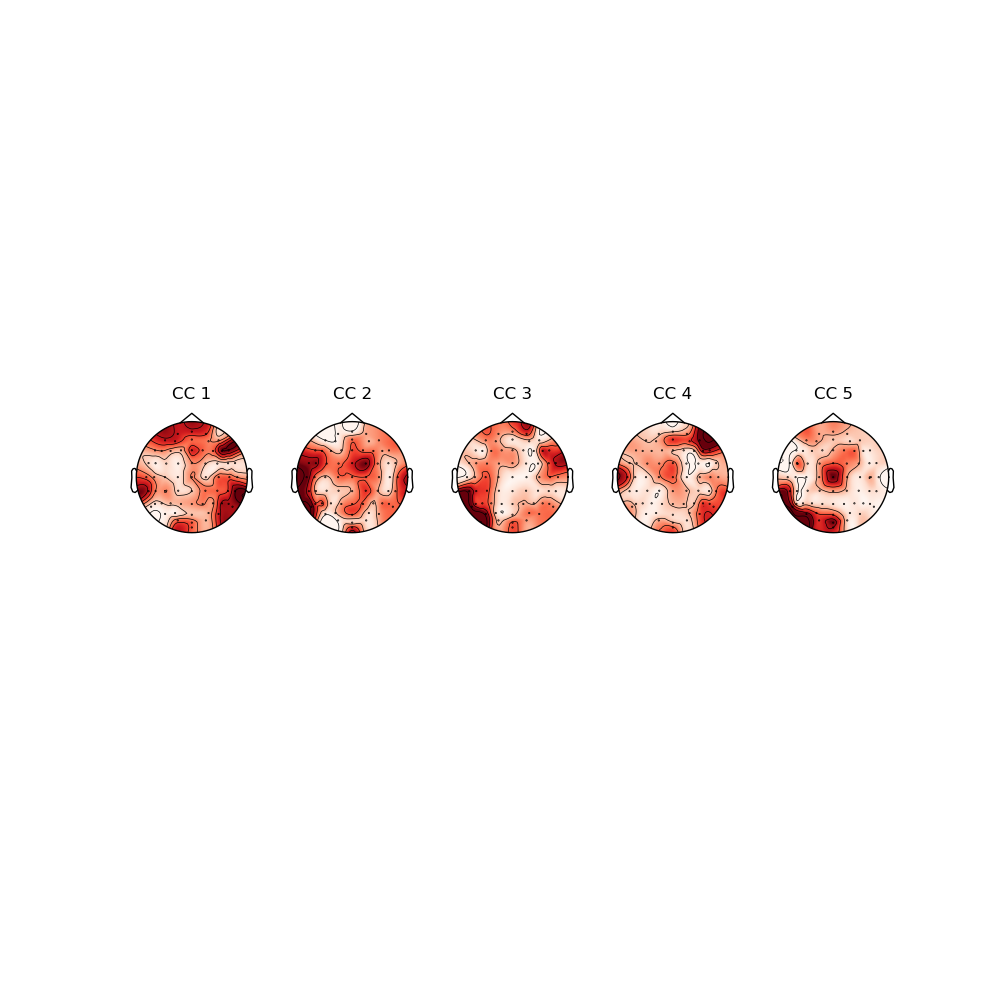

In [278]:
# Visualization: spatial (temporal) filter
eeg_onesub = np.concatenate(tuple(eeg_onesub_list), axis=0)
# forward_model = F_train
forward_model = SIGCCA.forward_model(eeg_onesub, Wlist_train)
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    mne.viz.plot_topomap(np.abs(forward_model[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()
# plt.savefig('figures/CCA_'+str(id_sub)+'.png')

In [ ]:
id_sub = 8
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
L_Stim = int(fs/2)
CCA = algo.CanonicalCorrelationAnalysis(eeg_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG=4, offset_Stim=0)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

In [171]:
id_sub = 10
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
L_Stim = int(fs/2)
CCA = algo.CanonicalCorrelationAnalysis(eog_onesub_list, mag_avg_list, fs, L_EEG, L_Stim, offset_EEG=4, offset_Stim=0)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, V_A_train, V_B_train = CCA.cross_val()

100%|██████████| 1000/1000 [00:05<00:00, 192.39it/s]

Significance level: 0.022492194756132226
Average correlation coefficients of the top 5 components on the training sets: [0.02992005 0.02290881 0.0174684  0.01499603 0.01283801]
Average correlation coefficients of the top 5 components on the test sets: [0.01649804 0.00803945 0.00384985 0.00169749 0.00362668]


In [ ]:
# # features: non-causal temporal filter 
# n_components = 5
# fold = 10
# id_sub = 9
# # eeg_onesub_list = [eeg[:,:,id_sub] for eeg in mix_64_list]
# eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
# eeg_onesub = eeg_multisub_concat[:,:,id_sub]
# mag_avg_list = [feats[:,8] for feats in features_list]
# center_list = [feats[:,13:15] for feats in features_list]
# L_EEG = 3 # correlations can be higher if include time lags
# L_feat = int(fs/2)
# offset_EEG = 1
# offset_Stim = 0
# corr_train, corr_test, dist_train, dist_test, V_A_train, V_B_train = utils.cross_val_CCA(eeg_onesub_list, mag_avg_list, fs, L_EEG, L_feat, offset_EEG, offset_Stim, fold, n_components, regularization='lwcov', K_regu=None, message=True, signifi_level=True)


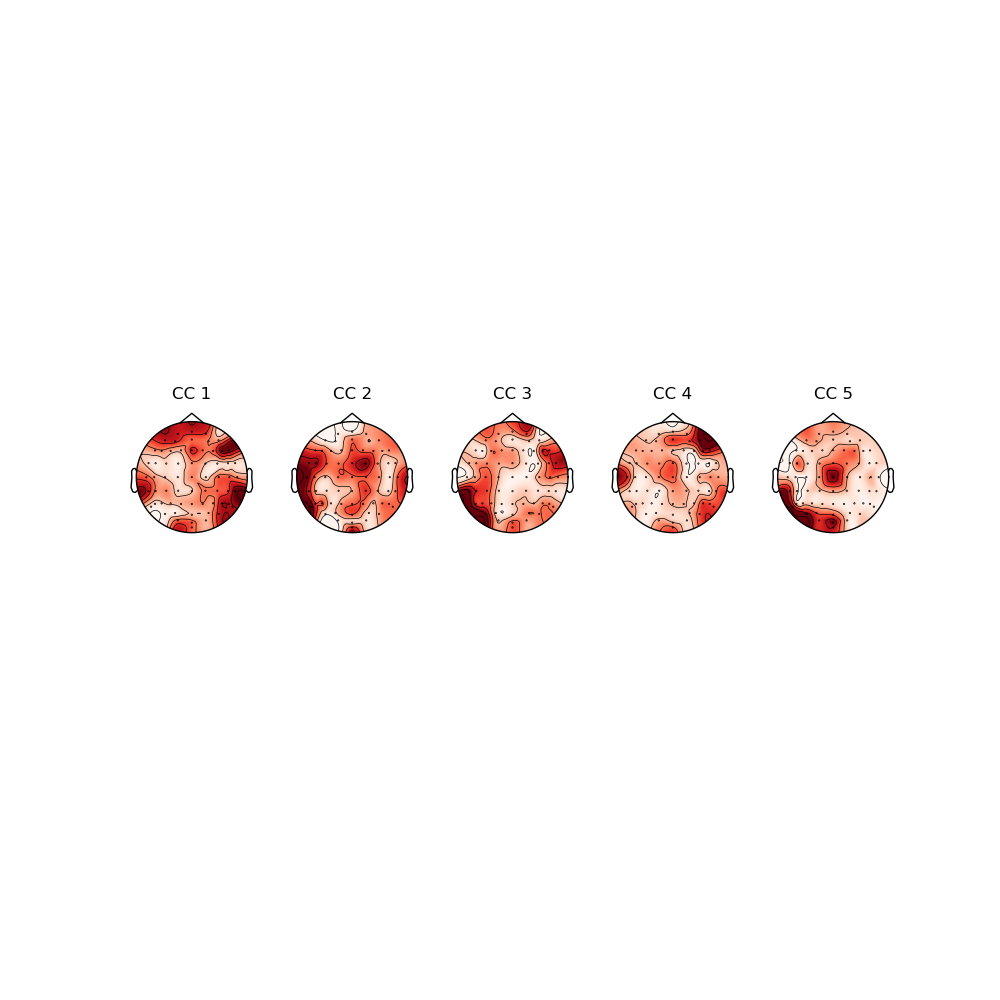

In [194]:
# Visualization: spatial (temporal) filter
eeg_onesub = np.concatenate(tuple(eeg_onesub_list), axis=0)
forward_model = CCA.forward_model(eeg_onesub, V_A_train)
# forward_model = utils.forward_model(eeg_onesub, V_A_train, L_EEG, offset=1)
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    mne.viz.plot_topomap(np.abs(forward_model[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()
# plt.savefig('figures/CCA_'+str(id_sub)+'.png')

In [ ]:
# A sanity check: GCCA-one subject + stimulus = CCA
# datalist = [eeg_onesub_list, mag_avg_list]
# Llist = [3, int(fs/2)]
# causal_list = [False, True]
# rhos= [1, 1]
# corr_train, corr_test, dist_train, dist_test, Wlist_train, Flist_train = utils.cross_val_GCCA_multi_mod(datalist, Llist, causal_list, rhos, fs, fold=10, n_components=5, regularization='lwcov', message=True, signifi_level=False, ISC=True)
# F_train = utils.F_organize(Flist_train[0], L=3, causal=False, avg=True)

# # Or use SI-GCCA
# datalist = [eeg_onesub_list, mag_avg_list]
# Llist = [3, int(fs/2)]
# causal_list = [False, True]
# rho= 1
# corr_train, corr_test, dist_train, dist_test, Wlist_train, F_train = utils.cross_val_SI_GCCA(datalist, Llist, causal_list, rho, fs, fold=10, n_components=5, regularization='lwcov', message=True, signifi_level=False, ISC=True)

# biosemi_layout = mne.channels.read_layout('biosemi')
# create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
# create_info.set_montage('biosemi64')
# plt.close()
# # plt.figure()
# plt.figure(figsize=(10, 10))
# for i in range(5):
#     ax = plt.subplot(1, 5, i + 1)
#     mne.viz.plot_topomap(np.abs(F_train[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
#     ax.set_title('CC '+str(i+1))
# plt.show()

In [44]:
conv_mtx = utils.block_Hankel(mag_avg, int(fs/2), causal=True)
eeg_conv = utils.block_Hankel(eeg_onesub, L_EEG, causal=False)
filtered_EEG = eeg_conv@V_A_train
filtered_Sti = conv_mtx@V_B_train
dt = times[1]-times[0]
grad = np.gradient(np.squeeze(mag_avg), dt)

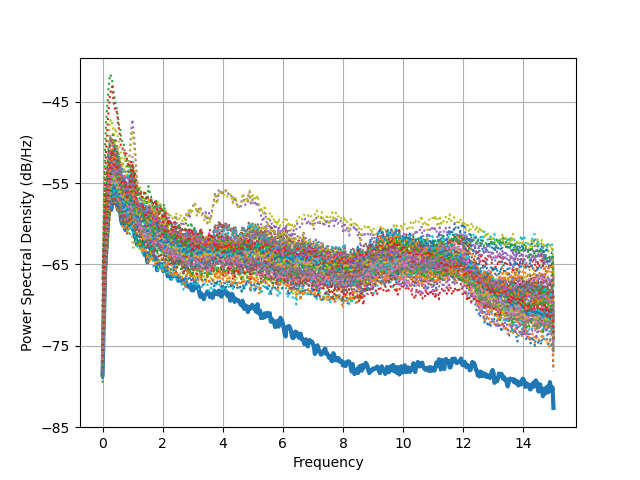

In [45]:
plt.close()
plt.psd(filtered_EEG[:,0], 1024, Fs=fs, linewidth=3)
for n in range(eeg_onesub.shape[1]):
    plt.psd(eeg_onesub[:,n], 1024, Fs=fs, linestyle=':')
plt.show()

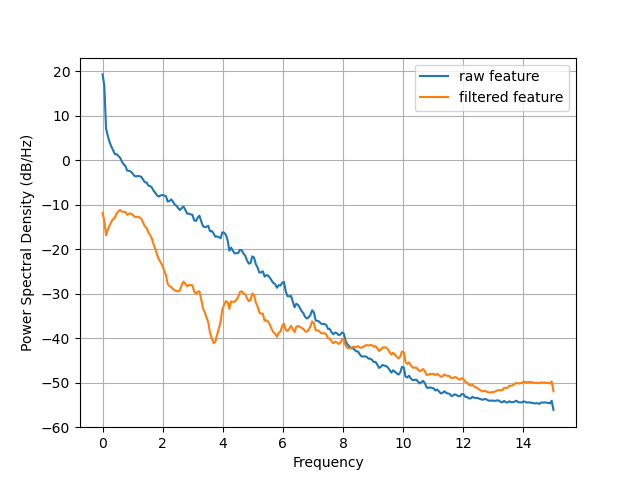

In [46]:
plt.close()
plt.psd(np.squeeze(mag_avg), 512, Fs=fs, label="raw feature")
plt.psd(filtered_Sti[:,0], 512, Fs=fs, label="filtered feature")
plt.legend()
plt.show()

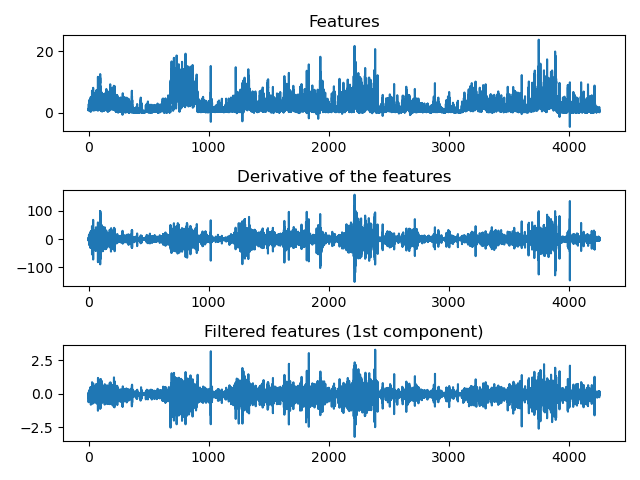

In [47]:
# Visualizations: temporal filter
plt.close()
compo = 1
ax1 = plt.subplot(311)
ax1.plot(times, mag_avg)
ax1.title.set_text('Features')
ax2 = plt.subplot(312, sharex = ax1)
ax2.plot(times, grad)
ax2.title.set_text('Derivative of the features')
ax3 = plt.subplot(313, sharex = ax1)
ax3.plot(times, filtered_Sti[:,compo-1])
ax3.title.set_text('Filtered features (1st component)')
plt.tight_layout()
plt.show()

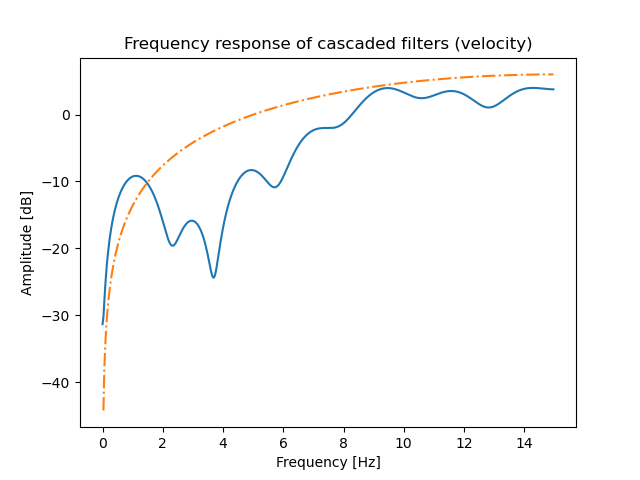

In [48]:
w, h = signal.freqz(b=V_B_train[:,0], a=1)
# h = h * np.exp(1j*15*w)
x = w * fs * 1.0 / (2 * np.pi)
y = 20 * np.log10(abs(h))

w_diff, h_diff = signal.freqz(b=[1,-1], a=1)
y_diff = 20 * np.log10(abs(h_diff))


plt.close()
plt.plot(x, y)
plt.plot(x, y_diff, '-.')
# plt.plot(x,20 * np.log10(abs(h/h_diff)))
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [Hz]')
plt.title('Frequency response of cascaded filters (velocity)')
plt.show()

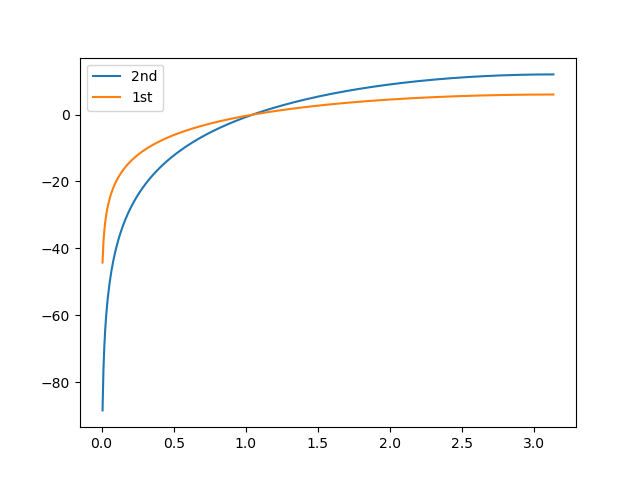

In [49]:
w1, h1 = signal.freqz(b=[1,-2,1], a=1)
w2, h2 = signal.freqz(b=[1,-1], a=1)
plt.close()
plt.plot(w1,20 * np.log10(abs(h1)), label="2nd")
plt.plot(w2,20 * np.log10(abs(h2)), label="1st")
# plt.set_ylabel('Amplitude [dB]')
# plt.set_xlabel('Frequency [Hz]')
# plt.set_title('Frequency response of CC 1')
plt.legend()
plt.show()

In [ ]:
# plt.close()
# fig, axes = plt.subplots(nrows=n_components, ncols=1, figsize=(10, 20))
# for n in range(n_components):
#     w, h = signal.freqz(b=V_B_train[:,n], a=1)
#     x = w * fs * 1.0 / (2 * np.pi)
#     y = 20 * np.log10(abs(h))
#     axes[n].plot(x, y)
# fig.tight_layout()
# plt.show()

plt.close()
w1, h1 = signal.freqz(b=V_B_train[:,0], a=1)
x1 = w1 * fs * 1.0 / (2 * np.pi)
y1 = 20 * np.log10(abs(h1))

w2, h2 = signal.freqz(b=V_B_train[:,1], a=1)
x2 = w2 * fs * 1.0 / (2 * np.pi)
y2 = 20 * np.log10(abs(h2))

w3, h3 = signal.freqz(b=V_B_train[:,2], a=1)
x3 = w3 * fs * 1.0 / (2 * np.pi)
y3 = 20 * np.log10(abs(h3))

plt.close()
plt.plot(x1, y1, label="CC 1")
plt.plot(x2 ,y2,'-.', label="CC 2")
plt.plot(x3 ,y3,'--', label="CC 3")

plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [Hz]')
plt.legend()
plt.title('Frequency response of components')
plt.show()

## CorrCA 

In [29]:
eeg = [eeg[:,:,0:6] for eeg in eeg_multisub_list]
corr_CA = algo.CorrelatedComponentAnalysis(eeg, fs, L=5, offset=2, signifi_level=True, n_components=10)
corr_train, corr_test, tsc_train, tsc_test, isc_train, isc_test, W_train, F_train = corr_CA.cross_val()
eeg_concat = np.concatenate(eeg, axis=0)
F = corr_CA.forward_model(eeg_concat, W_train)

100%|██████████| 1000/1000 [10:17<00:00,  1.62it/s]


Significance level: 0.0057183364221002585
Average ISC of the top 10 components on the training sets: [0.04731709 0.03942782 0.03496811 0.03308983 0.03083371 0.02773228
 0.02622464 0.02553194 0.024327   0.0233412 ]
Average ISC of the top 10 components on the test sets: [0.03303507 0.02028414 0.01282464 0.01856881 0.01418481 0.0040589
 0.00190805 0.00763889 0.00955753 0.00417053]


In [31]:
# n_sub = len(subjects)
eeg = [eeg[:,:,0:6] for eeg in eeg_multisub_list]
corr_CA = algo.CorrelatedComponentAnalysis(eeg, fs, L=5, offset=2, signifi_level=True, n_components=10, trials=True)
corr_train, corr_test, tsc_train, tsc_test, isc_train, isc_test, W_train, F_train = corr_CA.cross_val()
eeg_concat = np.concatenate(eeg, axis=0)
F = corr_CA.forward_model(eeg_concat, W_train)

100%|██████████| 1000/1000 [09:51<00:00,  1.69it/s]


Significance level: 0.005772190407352761
Average ISC of the top 10 components on the training sets: [0.04731709 0.03942782 0.03496811 0.03308983 0.03083371 0.02773228
 0.02622464 0.02553194 0.024327   0.0233412 ]
Average ISC of the top 10 components on the test sets: [0.03320737 0.02091881 0.01394753 0.01882065 0.01482134 0.00335169
 0.00124968 0.00781254 0.00918531 0.00442067]


In [ ]:
n_sub_total = len(subjects)
tsc_corr = np.zeros((n_sub_total-1,))
dist_corr = np.zeros((n_sub_total-1,))
avgcorr_test_corr = np.zeros((n_sub_total-1,10))
for n_sub in range(2,n_sub_total+1):
    print("n_sub = ", n_sub)
    eeg = [eeg[:,:,0:n_sub] for eeg in eeg_multisub_list]
    corr_CA = algo.CorrelatedComponentAnalysis(eeg, fs, L=5, offset=2, n_components=10, signifi_level=False)
    _, corr_test, _, tsc_test, _, isc_test, _, _ = corr_CA.cross_val()
    tsc_corr[n_sub-2] = np.average(tsc_test)
    dist_corr[n_sub-2] = np.average(dist_test)
    avgcorr_test_corr[n_sub-2,:] = np.average(corr_test, axis=0)
    print('tsc = ', tsc_corr[n_sub-2])
    print('dist = ', dist_corr[n_sub-2])

In [ ]:
subject_list = range(len(subjects))
corr_mean = []
tsc_mean = []
isc_mean = []
corr_std = []
tsc_std = []
isc_std = []
for n_sub in range(2, len(subjects)+1):
    print('number of subjects: ', n_sub)
    corr_list = []
    tsc_list = []
    isc_list = []
    count = 0
    comb_list = list(itertools.combinations(subject_list, n_sub))
    random.shuffle(comb_list)
    for item in comb_list:
        count += 1
        if count > 30:
            break
        eeg = [eeg[:,:,list(item)] for eeg in eeg_multisub_list]
        corr_CA = algo.CorrelatedComponentAnalysis(eeg, fs, L=5, offset=2, n_components=10, signifi_level=False, message=False)
        _, corr_test, _, tsc_test, _, isc_test, _, _ = corr_CA.cross_val()
        corr_list.append(corr_test)
        tsc_list.append(tsc_test)
        isc_list.append(isc_test)
    corr_all = np.concatenate(tuple(corr_list), axis=0)
    tsc_all = np.concatenate(tuple(tsc_list), axis=0)
    isc_all = np.concatenate(tuple(isc_list), axis=0)
    corr_mean.append(np.mean(corr_all, axis=0))
    tsc_mean.append(np.mean(tsc_all))
    print('tsc_mean: ', np.mean(tsc_all))
    isc_mean.append(np.mean(isc_all, axis=0))
    corr_std.append(np.std(corr_all, axis=0))
    tsc_std.append(np.std(tsc_all))
    print('tsc_std: ', np.std(tsc_all))
    isc_std.append(np.std(isc_all, axis=0))


In [33]:
# np.savez('tables/CorrCA_md.npz', tsc_mean=tsc_mean, tsc_std=tsc_std, corr_mean=corr_mean, corr_std=corr_std, isc_mean=isc_mean, isc_std=isc_std)

In [ ]:
nb_samples = eeg_multisub_concat.shape[0]
len_list = np.linspace(5, 70, 14).astype(int)
corr_mean = []
tsc_mean = []
isc_mean = []
corr_std = []
tsc_std = []
isc_std = []
for length in len_list:
    print('amount of data (min): ', length)
    len_block = length*fs*60
    idx_end = nb_samples-len_block
    corr_list = []
    tsc_list = []
    isc_list = []
    for count in range(30):
        start_point = random.randint(0, idx_end)
        eeg = [eeg_multisub_concat[start_point:start_point+len_block,:,:]]
        corr_CA = algo.CorrelatedComponentAnalysis(eeg, fs, L=5, offset=2, n_components=10, signifi_level=False, message=False)
        _, corr_test, _, tsc_test, _, isc_test, _, _ = corr_CA.cross_val()
        corr_list.append(corr_test)
        tsc_list.append(tsc_test)
        isc_list.append(isc_test)
    corr_all = np.concatenate(tuple(corr_list), axis=0)
    tsc_all = np.concatenate(tuple(tsc_list), axis=0)
    isc_all = np.concatenate(tuple(isc_list), axis=0)
    corr_mean.append(np.mean(corr_all, axis=0))
    tsc_mean.append(np.mean(tsc_all))
    print('tsc_mean: ', np.mean(tsc_all))
    isc_mean.append(np.mean(isc_all, axis=0))
    corr_std.append(np.std(corr_all, axis=0))
    tsc_std.append(np.std(tsc_all))
    print('tsc_std: ', np.std(tsc_all))
    isc_std.append(np.std(isc_all, axis=0))


In [41]:
eeg_sub_list = [eeg[:,:,0:5] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
offset_EEG = 2
L_Stim = int(fs/2)
offset_Stim = 0
SICorrCA = algo.StimulusInformedCorrCA([eeg_sub_list, mag_avg_list], fs, [L_EEG, L_Stim], [offset_EEG, offset_Stim], trials=True)
_, corr_test, _, tsc_test, _, dist_test, _, _, _ = SICorrCA.cross_val(rho=1)

100%|██████████| 1000/1000 [09:44<00:00,  1.71it/s]

Significance level: ISC=0.007207819030471325, TSC=0.0035912908572058623
Average ISC of the top 5 components on the training sets: [0.04256516 0.04620048 0.03864266 0.03839034 0.03535051]
Average ISC of the top 5 components on the test sets: [0.02399032 0.02594947 0.01324125 0.01539496 0.00362306]
Average TSC on the test sets: 0.01437886209928004


In [43]:
eeg_sub_list = [eeg[:,:,0:5] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
L_EEG = 5 # correlations can be higher if include time lags
offset_EEG = 2
L_Stim = int(fs/2)
offset_Stim = 0
SICorrCA = algo.StimulusInformedCorrCA([eeg_sub_list, mag_avg_list], fs, [L_EEG, L_Stim], [offset_EEG, offset_Stim])
_, corr_test, _, tsc_test, _, dist_test, _, _, _ = SICorrCA.cross_val(rho=1)

100%|██████████| 1000/1000 [10:51<00:00,  1.53it/s]

Significance level: ISC=0.007050470279091734, TSC=0.0006463446830725599
Average ISC of the top 5 components on the training sets: [0.04256516 0.04620048 0.03864266 0.03839034 0.03535051]
Average ISC of the top 5 components on the test sets: [0.02322749 0.02533071 0.01290258 0.01482894 0.0035486 ]
Average TSC on the test sets: 0.0031481479490609783


In [ ]:
n_sub_total = len(subjects)
rho_list_CorrCA= []
tsc_CorrCA = np.zeros((n_sub_total-1,))
dist_CorrCA = np.zeros((n_sub_total-1,))
avgcorr_test_CorrCA = np.zeros((n_sub_total-1,10))

for n_sub in range(2,n_sub_total+1):
    print("n_sub = ", n_sub)
    eeg = [eeg[:,:,0:n_sub] for eeg in eeg_multisub_list]
    nested_datalist = [eeg, mag_avg_list]
    Llist = [5, int(fs/2)]
    offsetlist = [2, 0]
    SICorrCA = algo.StimulusInformedCorrCA(nested_datalist, fs, Llist, offsetlist, n_components=10, signifi_level=False)
    _, corr_test, _, tsc_test, _, dist_test, _, _, rho = SICorrCA.cross_val()
    rho_list_CorrCA.append(rho)
    tsc_CorrCA[n_sub-2] = np.average(tsc_test)
    dist_CorrCA[n_sub-2] = np.average(dist_test)
    avgcorr_test_CorrCA[n_sub-2,:] = np.average(corr_test, axis=0)

In [ ]:
subject_list = range(len(subjects))
corr_mean = []
tsc_mean = []
corr_std = []
tsc_std = []
for n_sub in range(2, len(subjects)+1):
    print('number of subjects: ', n_sub)
    corr_list = []
    tsc_list = []
    count = 0
    comb_list = list(itertools.combinations(subject_list, n_sub))
    random.shuffle(comb_list)
    for item in comb_list:
        count += 1
        if count > 30:
            break
        eeg = [eeg[:,:,list(item)] for eeg in eeg_multisub_list]
        nested_datalist = [eeg, mag_avg_list]
        Llist = [5, int(fs/2)]
        offsetlist = [2, 0]
        SI_CorrCA = algo.StimulusInformedCorrCA(nested_datalist, fs, Llist, offsetlist, n_components=10, signifi_level=False, message=False)
        _, corr_test, _, tsc_test, _, _, _, _, _ = SI_CorrCA.cross_val()
        corr_list.append(corr_test)
        tsc_list.append(tsc_test)
    corr_all = np.concatenate(tuple(corr_list), axis=0)
    tsc_all = np.concatenate(tuple(tsc_list), axis=0)
    corr_mean.append(np.mean(corr_all, axis=0))
    tsc_mean.append(np.mean(tsc_all))
    print('tsc_mean: ', np.mean(tsc_all))
    corr_std.append(np.std(corr_all, axis=0))
    tsc_std.append(np.std(tsc_all))
    print('tsc_std: ', np.std(tsc_all))


In [67]:
# np.savez('tables/SICorrCA_md.npz', tsc_mean=tsc_mean, tsc_std=tsc_std, corr_mean=corr_mean, corr_std=corr_std, isc_mean=isc_mean, isc_std=isc_std)

In [ ]:
# Visualization: spatial (temporal) filter
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(10):
    ax = plt.subplot(2, 5, i + 1)
    mne.viz.plot_topomap(np.abs(F_train[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()
# plt.savefig('figures/CCA_'+str(id_sub)+'.png')

## GCCA

In [15]:
# GCCA-x subjects
eeg = [eeg[:,:,0:6] for eeg in eeg_multisub_list]
GCCA = algo.GeneralizedCCA(eeg, fs, L=5, offset=2, n_components=10, signifi_level=True)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, W_train, F_train = GCCA.cross_val()

100%|██████████| 1000/1000 [11:50<00:00,  1.41it/s]

Significance level: 0.005576164674194629
Average ISC of the top 10 components on the training sets: [0.08823905 0.08165267 0.07958477 0.07814417 0.07706051 0.07578964
 0.07477305 0.07399086 0.07302567 0.07237131]
Average ISC of the top 10 components on the test sets: [0.03363209 0.00567686 0.00964085 0.01279808 0.00748296 0.00235106
 0.00601336 0.00029794 0.00108621 0.0030574 ]


In [19]:
# GCCA-x subjects
eeg = [eeg[:,:,0:6] for eeg in eeg_multisub_list]
GCCA = algo.GeneralizedCCA(eeg, fs, L=5, offset=2, n_components=10, signifi_level=True, trials=True)
corr_train, corr_test, tsc_train, tsc_test, dist_train, dist_test, W_train, F_train = GCCA.cross_val()

100%|██████████| 1000/1000 [14:47<00:00,  1.13it/s]

Significance level: 0.005612644823955638
Average ISC of the top 10 components on the training sets: [0.08823905 0.08165267 0.07958477 0.07814417 0.07706051 0.07578964
 0.07477305 0.07399086 0.07302567 0.07237131]
Average ISC of the top 10 components on the test sets: [0.03355592 0.00606534 0.0094124  0.01193096 0.00624586 0.00207054
 0.00621137 0.00025055 0.00066767 0.00268483]


In [ ]:
n_sub_total = len(subjects)
tsc = np.zeros((n_sub_total-1,))
dist = np.zeros((n_sub_total-1,))
avgcorr_test = np.zeros((n_sub_total-1,10))
for n_sub in range(2,n_sub_total+1):
    print("n_sub = ", n_sub)
    eeg = [eeg[:,:,0:n_sub] for eeg in eeg_multisub_list]
    GCCA = algo.GeneralizedCCA(eeg, fs, L=5, offset=2, n_components=10, signifi_level=False)
    _, corr_test, _, tsc_test, _, dist_test, _, _ = GCCA.cross_val()
    tsc[n_sub-2] = np.average(tsc_test)
    dist[n_sub-2] = np.average(dist_test)
    avgcorr_test[n_sub-2,:] = np.average(corr_test, axis=0)
    print('tsc = ', tsc[n_sub-2])
    print('dist = ', dist[n_sub-2])

In [ ]:
subject_list = range(len(subjects))
corr_mean = []
tsc_mean = []
corr_std = []
tsc_std = []
for n_sub in range(2, len(subjects)+1):
    print('number of subjects: ', n_sub)
    corr_list = []
    tsc_list = []
    isc_list = []
    count = 0
    comb_list = list(itertools.combinations(subject_list, n_sub))
    random.shuffle(comb_list)
    for item in comb_list:
        count += 1
        if count > 30:
            break
        eeg = [eeg[:,:,list(item)] for eeg in eeg_multisub_list]
        GCCA = algo.GeneralizedCCA(eeg, fs, L=5, offset=2, n_components=10, signifi_level=False, message=False)
        _, corr_test, _, tsc_test, _, _, _, _ = GCCA.cross_val()
        corr_list.append(corr_test)
        tsc_list.append(tsc_test)
    corr_all = np.concatenate(tuple(corr_list), axis=0)
    tsc_all = np.concatenate(tuple(tsc_list), axis=0)
    corr_mean.append(np.mean(corr_all, axis=0))
    tsc_mean.append(np.mean(tsc_all))
    print('tsc_mean: ', np.mean(tsc_all))
    corr_std.append(np.std(corr_all, axis=0))
    tsc_std.append(np.std(tsc_all))
    print('tsc_std: ', np.std(tsc_all))


In [38]:
np.savez('tables/GCCA_trial.npz', tsc_mean=tsc_mean, tsc_std=tsc_std, corr_mean=corr_mean, corr_std=corr_std)

In [37]:
nb_samples = eeg_multisub_concat.shape[0]
len_list = np.linspace(10, 70, 13).astype(int)
corr_mean = []
tsc_mean = []
corr_std = []
tsc_std = []
for length in len_list:
    print('amount of data (min): ', length)
    len_block = length*fs*60
    idx_end = nb_samples-len_block
    corr_list = []
    tsc_list = []
    for count in range(30):
        start_point = random.randint(0, idx_end)
        eeg = [eeg_multisub_concat[start_point:start_point+len_block,:,:]]
        GCCA = algo.GeneralizedCCA(eeg, fs, L=5, offset=2, n_components=10, signifi_level=False, message=False, trials=True)
        _, corr_test, _, tsc_test, _, _, _, _ = GCCA.cross_val()
        corr_list.append(corr_test)
        tsc_list.append(tsc_test)
    corr_all = np.concatenate(tuple(corr_list), axis=0)
    tsc_all = np.concatenate(tuple(tsc_list), axis=0)
    corr_mean.append(np.mean(corr_all, axis=0))
    tsc_mean.append(np.mean(tsc_all))
    print('tsc_mean: ', np.mean(tsc_all))
    corr_std.append(np.std(corr_all, axis=0))
    tsc_std.append(np.std(tsc_all))
    print('tsc_std: ', np.std(tsc_all))

amount of data (min):  10
tsc_mean:  0.018619556525466145
tsc_std:  0.0017379156069932086
amount of data (min):  15
tsc_mean:  0.01841486259842948
tsc_std:  0.0016694301281045733
amount of data (min):  20
tsc_mean:  0.0181420719406634
tsc_std:  0.0011047143210978242
amount of data (min):  25
tsc_mean:  0.01796751433422689
tsc_std:  0.0012201570011435726
amount of data (min):  30
tsc_mean:  0.017885440157087946
tsc_std:  0.0009818394381451794
amount of data (min):  35
tsc_mean:  0.017740649790739624
tsc_std:  0.001038217412813798
amount of data (min):  40
tsc_mean:  0.01772948558226392
tsc_std:  0.00102033034966156
amount of data (min):  45
tsc_mean:  0.01760782129771416
tsc_std:  0.000936711590071774
amount of data (min):  50
tsc_mean:  0.017577510827837813
tsc_std:  0.0009248059826445459
amount of data (min):  55
tsc_mean:  0.01747712699327514
tsc_std:  0.0009476776482870861
amount of data (min):  60
tsc_mean:  0.017559495526073332
tsc_std:  0.0009210759947268078
amount of data (min):

In [32]:
eeg = [eeg[:,:,0:6] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
nested_datalist = [eeg, mag_avg_list]
Llist = [5, int(fs/2)]
offsetlist = [2, 0]
SI_GCCA = algo.StimulusInformedGCCA(nested_datalist, fs, Llist, offsetlist, n_components=10, message=True, signifi_level=True)
_, corr_test, _, tsc_test, _, dist_test, _, F_train, rho = SI_GCCA.cross_val(rho=1)

100%|██████████| 1000/1000 [11:56<00:00,  1.40it/s]

Significance level: ISC=0.005474067799557501, TSC=0.000525364979348487
Average ISC of the top 10 components on the training sets: [0.08408693 0.07531118 0.0806436  0.07813238 0.0773767  0.07619987
 0.07521939 0.074257   0.07301163 0.07248653]
Average ISC of the top 10 components on the test sets: [ 0.03404726  0.01743809  0.0056951   0.01137471  0.01085462  0.00426382
  0.0006673  -0.00018716  0.00282522  0.0058036 ]
Average TSC on the test sets: 0.0036417993723908124


In [35]:
eeg = [eeg[:,:,0:6] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
nested_datalist = [eeg, mag_avg_list]
Llist = [5, int(fs/2)]
offsetlist = [2, 0]
SI_GCCA = algo.StimulusInformedGCCA(nested_datalist, fs, Llist, offsetlist, n_components=10, message=True, signifi_level=True, trials=True)
_, corr_test, _, tsc_test, _, dist_test, _, F_train, rho = SI_GCCA.cross_val(rho=1)

100%|██████████| 1000/1000 [11:20<00:00,  1.47it/s]

Significance level: ISC=0.005558541741265578, TSC=0.003184516230594913
Average ISC of the top 10 components on the training sets: [0.08408693 0.07531118 0.0806436  0.07813238 0.0773767  0.07619987
 0.07521939 0.074257   0.07301163 0.07248653]
Average ISC of the top 10 components on the test sets: [0.03393984 0.01673213 0.005605   0.01187979 0.01007367 0.00345322
 0.00109539 0.00027086 0.00269376 0.00572405]
Average TSC on the test sets: 0.01715500782879672


In [ ]:
n_sub_total = len(subjects)
rho_list= []
tsc_sweep = np.zeros((n_sub_total-1,))
dist_sweep = np.zeros((n_sub_total-1,))
avgcorr_test_sweep = np.zeros((n_sub_total-1,10))

for n_sub in range(2,n_sub_total+1):
    print("n_sub = ", n_sub)
    eeg = [eeg[:,:,0:n_sub] for eeg in eeg_multisub_list]
    nested_datalist = [eeg, mag_avg_list]
    Llist = [5, int(fs/2)]
    offsetlist = [2, 0]
    SI_GCCA = algo.StimulusInformedGCCA(nested_datalist, fs, Llist, offsetlist, n_components=10, message=True)
    _, corr_test, _, tsc_test, _, dist_test, _, _, rho = SI_GCCA.cross_val()
    rho_list.append(rho)
    tsc_sweep[n_sub-2] = np.average(tsc_test)
    dist_sweep[n_sub-2] = np.average(dist_test)
    avgcorr_test_sweep[n_sub-2,:] = np.average(corr_test, axis=0)

In [ ]:
subject_list = range(len(subjects))
corr_mean = []
tsc_mean = []
corr_std = []
tsc_std = []
for n_sub in range(2, len(subjects)+1):
    print('number of subjects: ', n_sub)
    corr_list = []
    tsc_list = []
    isc_list = []
    count = 0
    comb_list = list(itertools.combinations(subject_list, n_sub))
    random.shuffle(comb_list)
    for item in comb_list:
        count += 1
        if count > 30:
            break
        eeg = [eeg[:,:,list(item)] for eeg in eeg_multisub_list]
        nested_datalist = [eeg, mag_avg_list]
        Llist = [5, int(fs/2)]
        offsetlist = [2, 0]
        SI_GCCA = algo.StimulusInformedGCCA(nested_datalist, fs, Llist, offsetlist, n_components=10, signifi_level=False, message=False)
        _, corr_test, _, tsc_test, _, _, _, _, _ = SI_GCCA.cross_val()
        corr_list.append(corr_test)
        tsc_list.append(tsc_test)
    corr_all = np.concatenate(tuple(corr_list), axis=0)
    tsc_all = np.concatenate(tuple(tsc_list), axis=0)
    corr_mean.append(np.mean(corr_all, axis=0))
    tsc_mean.append(np.mean(tsc_all))
    print('tsc_mean: ', np.mean(tsc_all))
    corr_std.append(np.std(corr_all, axis=0))
    tsc_std.append(np.std(tsc_all))
    print('tsc_std: ', np.std(tsc_all))


In [65]:
# np.savez('tables/SIGCCA_md.npz', tsc_mean=tsc_mean, tsc_std=tsc_std, corr_mean=corr_mean, corr_std=corr_std)

In [ ]:
# Visualization: spatial (temporal) filter
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(10):
    ax = plt.subplot(2, 5, i + 1)
    mne.viz.plot_topomap(np.abs(F_train[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()
# plt.savefig('figures/CCA_'+str(id_sub)+'.png')

## LS

In [ ]:
for id_sub in range(len(subjects)):
    eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
    eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
    mag_avg_list = [feats[:,8] for feats in features_list]
    center_list = [feats[:,13:15] for feats in features_list]
    mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
    muSqtempctra_list = [feats[:,18] for feats in features_list]
    LS = algo.LeastSquares(eeg_onesub_list, mag_avg_list, fs, decoding=True, L_EEG=5, offset_EEG=4)
    mse_train, mse_test, corr_train, corr_test, W_train = LS.cross_val()

In [ ]:
id_sub = 0
eeg_onesub_list = [eeg[:,:,id_sub] for eeg in eeg_multisub_list]
eog_onesub_list = [eog[:,:,id_sub] for eog in eog_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LS = algo.LeastSquares(eeg_onesub_list, mag_avg_list, fs, decoding=False, L_Stim=int(fs/2), offset_Stim=3)
mse_train, mse_test, corr_train, corr_test, W_train = LS.cross_val()

## LS-GCCA

In [110]:
id_sub = 0
flow_mag_avg_list = [feats[:,19] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LSGCCA = algo.LSGCCA(eeg_multisub_list, flow_mag_avg_list, fs, L_EEG=5, offset_EEG=2, L_Stim=int(fs/2), offset_Stim=0, id_sub=id_sub, corrca=False, pool=True, n_components=10)
LSGCCA.to_latent_space()
for id_sub in range(len(subjects)):
    LSGCCA.id_sub = id_sub
    corr_train, corr_test, We_train, Ws_train, F_train = LSGCCA.cross_val()

100%|██████████| 1000/1000 [00:54<00:00, 18.37it/s]


Significance level: 0.01440379587522695
Average correlation coefficients of the top 10 components on the training sets: [ 0.01322967  0.0067522  -0.01134784  0.00755583  0.00960502  0.01265539
  0.0080417   0.01385283  0.01350947  0.01009152]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00760341  0.00123477 -0.01285738  0.00052856  0.01523789  0.00561807
 -0.00128223  0.00412764  0.00317523 -0.00300356]


100%|██████████| 1000/1000 [00:51<00:00, 19.49it/s]


Significance level: 0.013810126307549925
Average correlation coefficients of the top 10 components on the training sets: [0.0168019  0.00326428 0.02305186 0.00992039 0.00722062 0.01149184
 0.00440399 0.00555494 0.01351057 0.01021867]
Average correlation coefficients of the top 10 components on the test sets: [ 0.0142427   0.00483415  0.01874964  0.00636973 -0.00014415  0.00783892
  0.00324237 -0.00094333 -0.00302833  0.00167159]


100%|██████████| 1000/1000 [00:50<00:00, 19.84it/s]


Significance level: 0.014369644075833025
Average correlation coefficients of the top 10 components on the training sets: [0.01927772 0.00340574 0.01367343 0.0090912  0.00099803 0.00589715
 0.00882028 0.0055794  0.00451199 0.00293186]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01355225 -0.00456961  0.00564261 -0.01350927  0.00198416  0.01364308
 -0.00925791  0.00349704  0.00710478  0.00332595]


100%|██████████| 1000/1000 [00:51<00:00, 19.33it/s]


Significance level: 0.011952621575320618
Average correlation coefficients of the top 10 components on the training sets: [0.02059334 0.00883765 0.02392648 0.00621585 0.00190565 0.00187076
 0.00238718 0.00764595 0.00916012 0.00648909]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01694664 -0.000526    0.01912424  0.00321855  0.00162274  0.0080767
  0.01136421 -0.00667122 -0.01611503  0.00774213]


100%|██████████| 1000/1000 [00:50<00:00, 19.71it/s]


Significance level: 0.01339009824437283
Average correlation coefficients of the top 10 components on the training sets: [0.01314735 0.00791398 0.01563539 0.00384309 0.00619171 0.00769927
 0.01197241 0.00714849 0.00966862 0.00868383]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00750583  0.00151016  0.00697103 -0.00725843  0.00570323 -0.00083571
  0.00443163 -0.0044078   0.01756471  0.00550077]


100%|██████████| 1000/1000 [00:50<00:00, 19.74it/s]


Significance level: 0.012625819605117463
Average correlation coefficients of the top 10 components on the training sets: [0.02472848 0.00754051 0.00558795 0.01100797 0.00730223 0.0052322
 0.00383637 0.00401596 0.00913605 0.0094521 ]
Average correlation coefficients of the top 10 components on the test sets: [ 1.39111457e-02  4.44560581e-03  4.23779365e-05  3.52415000e-03
 -2.54605053e-03  1.09318430e-02 -5.46419542e-03  4.14593354e-03
  1.27879758e-02  8.75055967e-03]


100%|██████████| 1000/1000 [00:58<00:00, 17.21it/s]


Significance level: 0.012788940449523781
Average correlation coefficients of the top 10 components on the training sets: [0.00641369 0.00525275 0.00743573 0.00831302 0.00780336 0.0008471
 0.01038074 0.00793105 0.01415093 0.0106204 ]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00244212  0.00555447  0.00493149  0.01088012 -0.0074373  -0.00130057
  0.00375904  0.01155678  0.00950333  0.00149333]


100%|██████████| 1000/1000 [01:08<00:00, 14.56it/s]


Significance level: 0.014246436912310707
Average correlation coefficients of the top 10 components on the training sets: [ 0.00840619 -0.0024967   0.00727535  0.00491954  0.00281159  0.00328892
  0.00361604  0.00202397  0.0080359   0.00289127]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00322256  0.00251516  0.00429288 -0.00342788  0.00231088 -0.00353421
  0.00441923  0.00550994 -0.00186268  0.00288563]


100%|██████████| 1000/1000 [00:50<00:00, 19.83it/s]


Significance level: 0.012681944407320974
Average correlation coefficients of the top 10 components on the training sets: [0.01984671 0.00814111 0.03809336 0.01247564 0.01412942 0.01377385
 0.00631886 0.0102863  0.01360765 0.00537902]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01836776  0.00347546  0.0263509   0.00837935 -0.0051164   0.01249583
  0.0080337   0.00241798  0.01181406 -0.00294949]


100%|██████████| 1000/1000 [00:49<00:00, 20.15it/s]


Significance level: 0.012829399985215671
Average correlation coefficients of the top 10 components on the training sets: [-0.00568218  0.00886053  0.01763096  0.00645928  0.01124912  0.00714668
  0.00581923 -0.00052536  0.00514839  0.00092444]
Average correlation coefficients of the top 10 components on the test sets: [-0.01160845  0.00558921  0.0088922   0.00155478  0.0108701  -0.00032772
 -0.00081576  0.00282104  0.0045649  -0.00105654]


100%|██████████| 1000/1000 [00:50<00:00, 19.95it/s]


Significance level: 0.011930283108786854
Average correlation coefficients of the top 10 components on the training sets: [0.01229317 0.00847524 0.00623793 0.01246305 0.00669837 0.00913501
 0.00398778 0.00104476 0.00306302 0.00366875]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00709806  0.0090316   0.00769246 -0.00037422  0.00454934  0.00434939
 -0.00561859  0.00040324 -0.00607104 -0.01655616]


100%|██████████| 1000/1000 [00:50<00:00, 19.92it/s]


Significance level: 0.014927620542724448
Average correlation coefficients of the top 10 components on the training sets: [0.0138225  0.00886608 0.00350697 0.00191045 0.00267118 0.00207491
 0.00583475 0.0015488  0.00155202 0.00270448]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00761892  0.00703558 -0.00234747 -0.00195717  0.00454877 -0.0023415
  0.00575329  0.00350933 -0.00181136 -0.00255135]


100%|██████████| 1000/1000 [00:49<00:00, 20.14it/s]


Significance level: 0.013571861486691244
Average correlation coefficients of the top 10 components on the training sets: [0.00409722 0.01232362 0.00778809 0.00962182 0.01712278 0.0075022
 0.00487475 0.01024036 0.00902184 0.00804995]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00589612  0.00337205 -0.00129394  0.00857205  0.00958384  0.01090577
  0.00332183 -0.00770543 -0.0122524   0.00206501]


100%|██████████| 1000/1000 [00:50<00:00, 19.91it/s]


Significance level: 0.01332586784961277
Average correlation coefficients of the top 10 components on the training sets: [-0.00050196  0.01300448  0.01428503  0.00209201  0.00693641  0.00283599
  0.00512562  0.01020691  0.00250171  0.00452388]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00825988  0.00702829  0.00270403 -0.00916892 -0.00615143 -0.0090142
  0.00056822 -0.00542514  0.00074228 -0.00513536]


In [14]:
id_sub = 0
flow_mag_avg_list = [feats[:,19] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LSGCCA = algo.LSGCCA(eeg_multisub_list, flow_mag_avg_list, fs, L_EEG=5, offset_EEG=2, L_Stim=int(fs/2), offset_Stim=0, id_sub=id_sub, corrca=True, pool=True, n_components=10)
LSGCCA.to_latent_space()
for id_sub in range(len(subjects)):
    LSGCCA.id_sub = id_sub
    corr_train, corr_test, We_train, Ws_train, F_train = LSGCCA.cross_val()

100%|██████████| 1000/1000 [00:58<00:00, 17.16it/s]


Significance level: 0.01370134994332466
Average correlation coefficients of the top 10 components on the training sets: [ 0.01146857  0.00873484 -0.00503805  0.00035645  0.02807655  0.01127851
  0.00832961  0.00813221  0.01026758  0.00492295]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00702476  0.01003256 -0.00771496 -0.00173208  0.02117013  0.00868464
  0.00789418 -0.00664696  0.01022842 -0.00451505]


100%|██████████| 1000/1000 [00:59<00:00, 16.74it/s]


Significance level: 0.013560087129933868
Average correlation coefficients of the top 10 components on the training sets: [0.00635494 0.01558316 0.01799201 0.01135976 0.02103991 0.00520198
 0.01039963 0.00547095 0.00428343 0.00917872]
Average correlation coefficients of the top 10 components on the test sets: [0.00889513 0.01286256 0.01714376 0.01246346 0.02041932 0.00033152
 0.00428235 0.0041589  0.00084644 0.00190715]


100%|██████████| 1000/1000 [01:00<00:00, 16.50it/s]


Significance level: 0.014054252970279655
Average correlation coefficients of the top 10 components on the training sets: [ 0.01912827  0.01318894  0.00989096  0.00261413  0.00916733  0.01034746
  0.01018557  0.00719808  0.00634191 -0.00117663]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01479831  0.00870147  0.0077761  -0.00534434  0.01395399  0.00363722
  0.00039644 -0.00060046 -0.00363647 -0.00452392]


100%|██████████| 1000/1000 [00:58<00:00, 17.14it/s]


Significance level: 0.01356123904000683
Average correlation coefficients of the top 10 components on the training sets: [ 0.00912553  0.02119846  0.02800529  0.01073024  0.00747251 -0.00149542
  0.01068722  0.00998043  0.00603242  0.00141381]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01262203  0.01886152  0.02264333  0.00429989  0.00820677 -0.00096803
  0.00657225  0.002672    0.0019963   0.00335203]


100%|██████████| 1000/1000 [01:00<00:00, 16.63it/s]


Significance level: 0.013963923974392405
Average correlation coefficients of the top 10 components on the training sets: [0.01130665 0.01255905 0.01751637 0.0032892  0.01686315 0.00844521
 0.00874672 0.00713929 0.00997837 0.00628303]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00652638  0.00669485  0.01265531 -0.00471941  0.0140427   0.0054827
  0.00396292  0.00532269  0.00854629  0.00325285]


100%|██████████| 1000/1000 [00:59<00:00, 16.86it/s]


Significance level: 0.013640994948323574
Average correlation coefficients of the top 10 components on the training sets: [ 0.02884149  0.02186335  0.02197432 -0.00088076  0.02057297  0.01255827
  0.01440843  0.00438161  0.00748172  0.00977161]
Average correlation coefficients of the top 10 components on the test sets: [ 0.02264095  0.01775102  0.01933447 -0.00553638  0.02054501  0.004214
  0.01360093  0.00327584 -0.00988371  0.00505935]


100%|██████████| 1000/1000 [00:58<00:00, 17.05it/s]


Significance level: 0.01357417146005193
Average correlation coefficients of the top 10 components on the training sets: [-0.00553894  0.01447127  0.00075051  0.00311201  0.01331162  0.00419727
 -0.00267259 -0.00037471 -0.00220217  0.00380058]
Average correlation coefficients of the top 10 components on the test sets: [-0.00295009  0.00884924  0.00301508  0.00287626  0.01362314 -0.00381556
 -0.00398199  0.0046162  -0.00455251  0.00206765]


100%|██████████| 1000/1000 [00:59<00:00, 16.85it/s]


Significance level: 0.013771480124120872
Average correlation coefficients of the top 10 components on the training sets: [ 0.00513198  0.00806631  0.00898874  0.00120037  0.00349793 -0.00082003
  0.00050886  0.00190863 -0.0001629   0.00231605]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00125148  0.00464104  0.00276974 -0.00468852  0.00401663 -0.0043673
  0.00413507 -0.00046745  0.00271851 -0.00092573]


100%|██████████| 1000/1000 [00:58<00:00, 17.19it/s]


Significance level: 0.01337072734032625
Average correlation coefficients of the top 10 components on the training sets: [0.02441942 0.01290953 0.02695934 0.01467533 0.01769559 0.00573408
 0.00943433 0.00596347 0.01393605 0.01318943]
Average correlation coefficients of the top 10 components on the test sets: [0.02588185 0.01024854 0.02065778 0.0096352  0.01611751 0.00333288
 0.00838076 0.00123213 0.00342896 0.00997676]


100%|██████████| 1000/1000 [00:58<00:00, 17.15it/s]


Significance level: 0.014176697018749839
Average correlation coefficients of the top 10 components on the training sets: [-0.01669749  0.01087759 -0.00040854  0.0052596   0.02361914  0.005761
  0.00086178  0.00041775  0.00623509  0.00792181]
Average correlation coefficients of the top 10 components on the test sets: [-0.02161814  0.00779044 -0.0059959   0.01111542  0.01854881  0.00587437
 -0.00148911 -0.00480135 -0.0041014   0.00890977]


100%|██████████| 1000/1000 [01:02<00:00, 15.96it/s]


Significance level: 0.013344112931329673
Average correlation coefficients of the top 10 components on the training sets: [0.00746555 0.01453792 0.02959324 0.00021285 0.02550067 0.01040304
 0.01820415 0.0081207  0.01164928 0.00878594]
Average correlation coefficients of the top 10 components on the test sets: [0.00681142 0.01088604 0.02686835 0.00076032 0.02198142 0.01126416
 0.01377818 0.01362272 0.00935303 0.00978135]


100%|██████████| 1000/1000 [01:03<00:00, 15.81it/s]


Significance level: 0.013456546083446238
Average correlation coefficients of the top 10 components on the training sets: [ 0.0037493   0.00282158 -0.00315529 -0.00135012  0.00729343  0.00034528
 -0.00056962  0.00244176  0.00022842  0.00435757]
Average correlation coefficients of the top 10 components on the test sets: [ 0.0042255   0.00420961 -0.00477935  0.00122081  0.00505858 -0.00291657
  0.00076282 -0.00206692  0.00174575 -0.0018521 ]


100%|██████████| 1000/1000 [00:59<00:00, 16.75it/s]


Significance level: 0.013588921267596523
Average correlation coefficients of the top 10 components on the training sets: [0.00543487 0.00149632 0.00882444 0.00237702 0.02609395 0.00281104
 0.00458911 0.01152844 0.00951658 0.00814395]
Average correlation coefficients of the top 10 components on the test sets: [0.00955564 0.00063566 0.01060218 0.00499218 0.01764139 0.0041712
 0.00231612 0.00260903 0.02057597 0.00200196]


100%|██████████| 1000/1000 [00:58<00:00, 17.18it/s]

Significance level: 0.013753178767282917
Average correlation coefficients of the top 10 components on the training sets: [-0.00762118  0.00775748  0.0100488   0.00463883  0.01194273  0.00154408
  0.00394097  0.0017601   0.00698997  0.00438557]
Average correlation coefficients of the top 10 components on the test sets: [-0.00510199  0.00954892  0.00856602  0.0019914   0.01593176 -0.00181538
  0.00176022 -0.00705581  0.00382058  0.00616536]


In [23]:
id_sub = 0
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LSGCCA = algo.LSGCCA(eeg_multisub_list, muSqtempctra_list, fs, L_EEG=5, offset_EEG=2, L_Stim=int(fs/2), offset_Stim=0, id_sub=id_sub, corrca=False, pool=False)
LSGCCA.to_latent_space()
for id_sub in range(len(subjects)):
    LSGCCA.id_sub = id_sub
    corr_train, corr_test, We_train, Ws_train, F_train = LSGCCA.cross_val()

100%|██████████| 1000/1000 [00:51<00:00, 19.46it/s]


Significance level of each component: [0.01345849 0.01426339 0.01362385 0.01432578 0.01456639]
Average correlation coefficients of the top 5 components on the training sets: [ 0.01723729 -0.01566448 -0.00928589  0.00696331  0.01391239]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01775543 -0.0193378  -0.01647519  0.00494146  0.0227126 ]


100%|██████████| 1000/1000 [00:51<00:00, 19.55it/s]


Significance level of each component: [0.0123314  0.01361737 0.0140069  0.01402118 0.01369406]
Average correlation coefficients of the top 5 components on the training sets: [0.01800571 0.00728976 0.02309354 0.00783479 0.00604155]
Average correlation coefficients of the top 5 components on the test sets: [0.01592596 0.00709832 0.02013981 0.001125   0.00199674]


100%|██████████| 1000/1000 [00:49<00:00, 20.10it/s]


Significance level of each component: [0.01356442 0.01442998 0.0118256  0.01304144 0.01434567]
Average correlation coefficients of the top 5 components on the training sets: [0.02685988 0.0171416  0.02019335 0.01571345 0.00945726]
Average correlation coefficients of the top 5 components on the test sets: [0.0244271  0.00757508 0.01538487 0.0069776  0.00205843]


100%|██████████| 1000/1000 [00:54<00:00, 18.29it/s]


Significance level of each component: [0.01024001 0.01039198 0.00985649 0.01285888 0.01188723]
Average correlation coefficients of the top 5 components on the training sets: [ 0.02134768  0.00758557  0.01768847  0.00500808 -0.00114203]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01992422  0.00049391  0.01460149 -0.00242019  0.00533135]


100%|██████████| 1000/1000 [00:54<00:00, 18.45it/s]


Significance level of each component: [0.01150011 0.0111952  0.01202954 0.01337862 0.0121884 ]
Average correlation coefficients of the top 5 components on the training sets: [0.01681187 0.02403033 0.03176938 0.00988787 0.00627688]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01319206  0.01534182  0.02709243 -0.00420603  0.00820502]


100%|██████████| 1000/1000 [00:55<00:00, 17.93it/s]


Significance level of each component: [0.01149385 0.01115771 0.01277569 0.01296095 0.01138131]
Average correlation coefficients of the top 5 components on the training sets: [0.02417867 0.01374642 0.01677221 0.01463418 0.00999812]
Average correlation coefficients of the top 5 components on the test sets: [0.01840598 0.01455417 0.00839196 0.00574516 0.00675215]


100%|██████████| 1000/1000 [00:54<00:00, 18.38it/s]


Significance level of each component: [0.01202783 0.0109754  0.01160226 0.01188255 0.01158747]
Average correlation coefficients of the top 5 components on the training sets: [0.02408443 0.00823028 0.01079211 0.00495879 0.00469614]
Average correlation coefficients of the top 5 components on the test sets: [ 0.02212806  0.00632064  0.00676102  0.01242298 -0.00195006]


100%|██████████| 1000/1000 [00:55<00:00, 18.12it/s]


Significance level of each component: [0.01458072 0.01299734 0.0134423  0.01318253 0.01406402]
Average correlation coefficients of the top 5 components on the training sets: [0.00781942 0.0205694  0.01179256 0.00762531 0.00585039]
Average correlation coefficients of the top 5 components on the test sets: [ 0.00601598  0.02246484  0.00818024 -0.00196128  0.00250643]


100%|██████████| 1000/1000 [00:55<00:00, 17.90it/s]


Significance level of each component: [0.01108306 0.01192378 0.01159868 0.01148589 0.01175059]
Average correlation coefficients of the top 5 components on the training sets: [0.0191335  0.01914177 0.04491001 0.01509153 0.01832291]
Average correlation coefficients of the top 5 components on the test sets: [0.0194375  0.01473475 0.03913563 0.01668494 0.01099945]


100%|██████████| 1000/1000 [00:54<00:00, 18.31it/s]


Significance level of each component: [0.01164963 0.01013248 0.0113514  0.01266434 0.01092747]
Average correlation coefficients of the top 5 components on the training sets: [0.00155461 0.02263317 0.02471064 0.01098182 0.01276853]
Average correlation coefficients of the top 5 components on the test sets: [-0.0032888   0.01185641  0.01982736  0.0162956   0.01284865]


100%|██████████| 1000/1000 [00:54<00:00, 18.50it/s]


Significance level of each component: [0.01105117 0.01027163 0.01100017 0.0119333  0.00944013]
Average correlation coefficients of the top 5 components on the training sets: [0.01712694 0.0235498  0.00887378 0.01745545 0.00629363]
Average correlation coefficients of the top 5 components on the test sets: [0.01081232 0.02195454 0.00579058 0.00346037 0.01054107]


100%|██████████| 1000/1000 [00:54<00:00, 18.19it/s]


Significance level of each component: [0.01312505 0.01398232 0.01313291 0.01594074 0.01375272]
Average correlation coefficients of the top 5 components on the training sets: [0.01118079 0.00463997 0.00830671 0.00293292 0.00441801]
Average correlation coefficients of the top 5 components on the test sets: [ 0.00717409 -0.00043962  0.0041682   0.00452322  0.00337917]


100%|██████████| 1000/1000 [00:54<00:00, 18.35it/s]


Significance level of each component: [0.01246216 0.01378934 0.01301138 0.01225627 0.01246892]
Average correlation coefficients of the top 5 components on the training sets: [0.01332006 0.00917403 0.02053743 0.00756741 0.00776467]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01414978 -0.00076509  0.00919627 -0.00069259  0.01178465]


100%|██████████| 1000/1000 [00:54<00:00, 18.28it/s]

Significance level of each component: [0.01304081 0.01193065 0.0133712  0.0133539  0.01359692]
Average correlation coefficients of the top 5 components on the training sets: [0.00354239 0.01304038 0.0093248  0.00430706 0.0034842 ]
Average correlation coefficients of the top 5 components on the test sets: [ 0.00283194  0.00518511  0.00847792 -0.0006083  -0.01038374]


In [111]:
id_sub = 0
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LSGCCA = algo.LSGCCA(eeg_multisub_list, muSqtempctra_list, fs, L_EEG=5, offset_EEG=2, L_Stim=int(fs/2), offset_Stim=0, id_sub=id_sub, corrca=True, pool=False)
LSGCCA.to_latent_space()
for id_sub in range(len(subjects)):
    LSGCCA.id_sub = id_sub
    corr_train, corr_test, We_train, Ws_train, F_train = LSGCCA.cross_val()

100%|██████████| 1000/1000 [00:48<00:00, 20.79it/s]


Significance level of each component: [0.01060942 0.01024743 0.00869945 0.01002981 0.01105617]
Average correlation coefficients of the top 5 components on the training sets: [ 0.01240332  0.01587589 -0.00410472  0.00948776  0.02489387]
Average correlation coefficients of the top 5 components on the test sets: [ 0.01825061  0.016239   -0.00994665  0.0120537   0.02617205]


100%|██████████| 1000/1000 [00:52<00:00, 19.23it/s]


Significance level of each component: [0.01086697 0.00928243 0.00887951 0.00889975 0.01076239]
Average correlation coefficients of the top 5 components on the training sets: [0.00225382 0.01418826 0.02639499 0.00287872 0.02587617]
Average correlation coefficients of the top 5 components on the test sets: [ 0.00402909  0.01728951  0.02359095 -0.00155353  0.02719209]


100%|██████████| 1000/1000 [00:48<00:00, 20.47it/s]


Significance level of each component: [0.01181619 0.00953391 0.00848757 0.01125006 0.01200282]
Average correlation coefficients of the top 5 components on the training sets: [0.03667568 0.02006871 0.01109578 0.0093739  0.01750901]
Average correlation coefficients of the top 5 components on the test sets: [0.03619505 0.01576389 0.01124443 0.00423271 0.01751586]


100%|██████████| 1000/1000 [00:47<00:00, 20.92it/s]


Significance level of each component: [0.01002907 0.00988832 0.00843693 0.00814911 0.0104375 ]
Average correlation coefficients of the top 5 components on the training sets: [0.00359207 0.01710132 0.03234112 0.00585394 0.01009254]
Average correlation coefficients of the top 5 components on the test sets: [0.00421507 0.01738756 0.02692502 0.00156949 0.01005179]


100%|██████████| 1000/1000 [00:47<00:00, 21.10it/s]


Significance level of each component: [0.01153373 0.00903287 0.00991766 0.00816501 0.01032748]
Average correlation coefficients of the top 5 components on the training sets: [0.02632866 0.01387327 0.04258822 0.0067537  0.01291007]
Average correlation coefficients of the top 5 components on the test sets: [0.02509453 0.01292415 0.03582839 0.00218666 0.01157757]


100%|██████████| 1000/1000 [00:47<00:00, 20.99it/s]


Significance level of each component: [0.01048188 0.00998248 0.01003231 0.00911847 0.01063165]
Average correlation coefficients of the top 5 components on the training sets: [0.02413787 0.02228115 0.03621554 0.00779484 0.01837723]
Average correlation coefficients of the top 5 components on the test sets: [0.02384702 0.02002695 0.03140652 0.00342881 0.01842459]


100%|██████████| 1000/1000 [00:47<00:00, 21.01it/s]


Significance level of each component: [0.01032037 0.0096376  0.00899989 0.0078362  0.01032658]
Average correlation coefficients of the top 5 components on the training sets: [0.00717457 0.01599139 0.00360429 0.00224165 0.01819922]
Average correlation coefficients of the top 5 components on the test sets: [0.00794633 0.01383169 0.00397884 0.00286503 0.01419057]


100%|██████████| 1000/1000 [00:47<00:00, 20.93it/s]


Significance level of each component: [0.01039715 0.01004652 0.00885524 0.00969021 0.00988333]
Average correlation coefficients of the top 5 components on the training sets: [-0.00897819  0.01206683  0.01430731  0.0114932   0.00714083]
Average correlation coefficients of the top 5 components on the test sets: [-0.00784904  0.01187835  0.01128088  0.00639594  0.00551632]


100%|██████████| 1000/1000 [00:47<00:00, 21.09it/s]


Significance level of each component: [0.01107231 0.0095603  0.00962627 0.00815535 0.00998349]
Average correlation coefficients of the top 5 components on the training sets: [0.02673785 0.02659249 0.03482573 0.01495627 0.02513141]
Average correlation coefficients of the top 5 components on the test sets: [0.02751756 0.02648181 0.0305653  0.0143481  0.02645591]


100%|██████████| 1000/1000 [00:48<00:00, 20.43it/s]


Significance level of each component: [0.01133391 0.00963697 0.01120957 0.00828088 0.01092562]
Average correlation coefficients of the top 5 components on the training sets: [-0.00552803  0.01695546  0.01391816 -0.00103059  0.04193898]
Average correlation coefficients of the top 5 components on the test sets: [-0.00683821  0.01542726  0.00929631 -0.00233507  0.03365099]


100%|██████████| 1000/1000 [00:47<00:00, 20.98it/s]


Significance level of each component: [0.01028958 0.00914367 0.00830407 0.00847726 0.00973808]
Average correlation coefficients of the top 5 components on the training sets: [ 0.00556976  0.01627412  0.03646818 -0.00277294  0.03869178]
Average correlation coefficients of the top 5 components on the test sets: [ 0.00415242  0.01458061  0.03495491 -0.00486318  0.03513424]


100%|██████████| 1000/1000 [00:47<00:00, 20.85it/s]


Significance level of each component: [0.00965741 0.00976661 0.00889792 0.00907849 0.01098673]
Average correlation coefficients of the top 5 components on the training sets: [0.01032102 0.01186335 0.00443006 0.00489089 0.01569416]
Average correlation coefficients of the top 5 components on the test sets: [0.01174725 0.01024931 0.00599231 0.0025784  0.01503005]


100%|██████████| 1000/1000 [00:47<00:00, 21.09it/s]


Significance level of each component: [0.00995923 0.00969474 0.00871906 0.00877365 0.01120668]
Average correlation coefficients of the top 5 components on the training sets: [0.01902266 0.00956959 0.03305732 0.01980201 0.02517505]
Average correlation coefficients of the top 5 components on the test sets: [0.01846075 0.00974692 0.03100561 0.01763464 0.01586044]


100%|██████████| 1000/1000 [00:51<00:00, 19.51it/s]


Significance level of each component: [0.01053259 0.01038074 0.00842684 0.0107491  0.0109955 ]
Average correlation coefficients of the top 5 components on the training sets: [-0.00658762  0.00740418  0.004575    0.00197136  0.0111073 ]
Average correlation coefficients of the top 5 components on the test sets: [-0.00582966  0.00738314  0.00528033  0.00839286  0.01052168]


In [112]:
id_sub = 0
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LSGCCA = algo.LSGCCA(eeg_multisub_list, mag_avg_list, fs, L_EEG=5, offset_EEG=2, L_Stim=int(fs/2), offset_Stim=0, id_sub=id_sub, corrca=False, pool=True, n_components=10)
LSGCCA.to_latent_space()
for id_sub in range(len(subjects)):
    LSGCCA.id_sub = id_sub
    corr_train, corr_test, We_train, Ws_train, F_train = LSGCCA.cross_val()

100%|██████████| 1000/1000 [00:43<00:00, 23.01it/s]


Significance level: 0.014258901854386233
Average correlation coefficients of the top 10 components on the training sets: [ 0.01625348 -0.01036438 -0.00178889  0.00531204  0.01252392  0.01277388
  0.01047957  0.00915003  0.00886913  0.01568719]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01707877 -0.01204458 -0.01359901  0.00035536  0.01570967  0.01924154
  0.00692538  0.00138591 -0.00047953  0.00116889]


100%|██████████| 1000/1000 [00:41<00:00, 23.83it/s]


Significance level: 0.01334320209393621
Average correlation coefficients of the top 10 components on the training sets: [0.02341126 0.01881371 0.03556522 0.01446169 0.01251385 0.01733918
 0.00620159 0.00707582 0.01480289 0.00969307]
Average correlation coefficients of the top 10 components on the test sets: [ 0.02083975  0.01915069  0.03382486  0.00397064  0.00303031  0.01593594
  0.00793635  0.0070603   0.00356352 -0.00707148]


100%|██████████| 1000/1000 [00:41<00:00, 24.01it/s]


Significance level: 0.013652311657738756
Average correlation coefficients of the top 10 components on the training sets: [0.0397176  0.01040528 0.02507158 0.01770234 0.01177166 0.01253278
 0.00818688 0.00343858 0.00568978 0.00352025]
Average correlation coefficients of the top 10 components on the test sets: [0.03343903 0.0028375  0.02076287 0.00888643 0.00687566 0.00683293
 0.0067992  0.0092357  0.0005306  0.01233817]


100%|██████████| 1000/1000 [00:41<00:00, 23.86it/s]


Significance level: 0.011304503993402885
Average correlation coefficients of the top 10 components on the training sets: [0.02160073 0.01875394 0.03536273 0.01174187 0.00302759 0.01213256
 0.00696283 0.00598943 0.01178184 0.00604734]
Average correlation coefficients of the top 10 components on the test sets: [0.02185745 0.00898403 0.03080943 0.00721712 0.01516634 0.00246801
 0.00267791 0.00892789 0.00214388 0.00494114]


100%|██████████| 1000/1000 [00:42<00:00, 23.69it/s]


Significance level: 0.012769279402497002
Average correlation coefficients of the top 10 components on the training sets: [0.0195825  0.03135014 0.04348304 0.01280795 0.01114048 0.0199476
 0.01903302 0.0147333  0.01320043 0.01353221]
Average correlation coefficients of the top 10 components on the test sets: [0.01517531 0.02250657 0.03473297 0.00399478 0.00966011 0.01526467
 0.00262699 0.00016824 0.01707876 0.01191274]


100%|██████████| 1000/1000 [00:42<00:00, 23.60it/s]


Significance level: 0.0122842679143353
Average correlation coefficients of the top 10 components on the training sets: [0.03569355 0.02182443 0.02960426 0.01818573 0.0160173  0.01542257
 0.00822993 0.00913642 0.01322541 0.0146301 ]
Average correlation coefficients of the top 10 components on the test sets: [0.02778342 0.02092259 0.02191443 0.0109117  0.00490214 0.00534152
 0.00838771 0.01216609 0.0102808  0.00648168]


100%|██████████| 1000/1000 [00:42<00:00, 23.50it/s]


Significance level: 0.01210794721360468
Average correlation coefficients of the top 10 components on the training sets: [0.02268372 0.00248592 0.02251374 0.01081493 0.01122005 0.008392
 0.01237517 0.00633121 0.00680529 0.01153569]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01763822 -0.00303946  0.01604477  0.02316952  0.00073645  0.00373445
  0.01319179  0.00962323  0.00170748  0.01280583]


100%|██████████| 1000/1000 [00:46<00:00, 21.66it/s]


Significance level: 0.013988409603307227
Average correlation coefficients of the top 10 components on the training sets: [0.00825573 0.0214435  0.00899242 0.0113641  0.01090381 0.01016269
 0.01054668 0.00878526 0.01214964 0.00950094]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00423092  0.02028356  0.00316398 -0.00112158  0.00593935  0.00702491
  0.00628094  0.01780346  0.0120425   0.005139  ]


100%|██████████| 1000/1000 [00:41<00:00, 23.87it/s]


Significance level: 0.012043178452378846
Average correlation coefficients of the top 10 components on the training sets: [0.02326373 0.01504392 0.05502807 0.02234604 0.02348184 0.01579303
 0.01242801 0.01120808 0.01027524 0.00872193]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01912702  0.0141515   0.04224392  0.02002821  0.01318898  0.01810223
  0.00921165  0.0005574  -0.00381864  0.0033329 ]


100%|██████████| 1000/1000 [00:42<00:00, 23.80it/s]


Significance level: 0.011834765908256295
Average correlation coefficients of the top 10 components on the training sets: [0.00720244 0.02042888 0.04025931 0.01089432 0.01717143 0.01007211
 0.00954353 0.00654011 0.00374733 0.00602972]
Average correlation coefficients of the top 10 components on the test sets: [0.0030023  0.01100234 0.03038477 0.01116679 0.01872769 0.00258531
 0.00834959 0.00249048 0.00083747 0.00068171]


100%|██████████| 1000/1000 [00:41<00:00, 23.82it/s]


Significance level: 0.011086878417201995
Average correlation coefficients of the top 10 components on the training sets: [0.01752489 0.02641807 0.01067093 0.01792247 0.01434151 0.02054867
 0.00872511 0.00549683 0.00494095 0.01141649]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01631552  0.02073054  0.00576291  0.00600573  0.01406711  0.01152897
  0.0078144   0.01642018 -0.00172627  0.00101179]


100%|██████████| 1000/1000 [00:42<00:00, 23.54it/s]


Significance level: 0.01431660309558264
Average correlation coefficients of the top 10 components on the training sets: [ 0.01523669  0.0041807   0.01454202  0.00405589  0.00674205 -0.0019723
  0.00580596  0.00028319 -0.00097186 -0.00165327]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01164635  0.00097571  0.00663262  0.00076978  0.01122081 -0.00345655
 -0.00991204 -0.00020757 -0.0022106   0.00467371]


100%|██████████| 1000/1000 [00:41<00:00, 23.83it/s]


Significance level: 0.012416110942915594
Average correlation coefficients of the top 10 components on the training sets: [0.00931636 0.00997178 0.02247923 0.01193363 0.01331376 0.00702483
 0.00475625 0.00555781 0.01076565 0.01316551]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01029681  0.00504611  0.01278724 -0.00167822  0.01574831 -0.00142933
  0.00718985  0.01217787  0.00129141 -0.00058651]


100%|██████████| 1000/1000 [00:42<00:00, 23.54it/s]

Significance level: 0.012883185718250444
Average correlation coefficients of the top 10 components on the training sets: [0.00501513 0.01597877 0.01990071 0.00993893 0.01038427 0.00255678
 0.00516487 0.00567165 0.00075146 0.00091522]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00507818  0.0126395   0.02382413 -0.00048187 -0.00611035 -0.00461468
 -0.00130409  0.00054987 -0.00893699 -0.00157468]


In [15]:
id_sub = 0
mag_avg_list = [feats[:,8] for feats in features_list]
center_list = [feats[:,13:15] for feats in features_list]
mutempctra_list = [np.abs(feats[:,17]) for feats in features_list]
muSqtempctra_list = [feats[:,18] for feats in features_list]
LSGCCA = algo.LSGCCA(eeg_multisub_list, mag_avg_list, fs, L_EEG=5, offset_EEG=2, L_Stim=int(fs/2), offset_Stim=0, id_sub=id_sub, corrca=True, pool=True, n_components=10)
LSGCCA.to_latent_space()
for id_sub in range(len(subjects)):
    LSGCCA.id_sub = id_sub
    corr_train, corr_test, We_train, Ws_train, F_train = LSGCCA.cross_val()

100%|██████████| 1000/1000 [00:57<00:00, 17.40it/s]


Significance level: 0.011464716493111725
Average correlation coefficients of the top 10 components on the training sets: [0.01290108 0.01721782 0.00201341 0.00346516 0.02918177 0.01276688
 0.00994414 0.00631853 0.01245887 0.00476706]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01744902  0.0119063  -0.0012584   0.00248219  0.02890314  0.0140365
  0.00142108  0.00228925  0.01048665  0.00187761]


100%|██████████| 1000/1000 [00:56<00:00, 17.57it/s]


Significance level: 0.0108985144317617
Average correlation coefficients of the top 10 components on the training sets: [0.00612811 0.03160096 0.04579455 0.00571094 0.03084185 0.01153603
 0.01975136 0.01395094 0.02045634 0.01313079]
Average correlation coefficients of the top 10 components on the test sets: [ 0.0041765   0.03172486  0.04051534 -0.00697527  0.03095636  0.0009872
  0.01760963  0.00805942  0.02400693  0.00991866]


100%|██████████| 1000/1000 [00:52<00:00, 18.97it/s]


Significance level: 0.011872560435854957
Average correlation coefficients of the top 10 components on the training sets: [ 0.03217393  0.02216979  0.01319395  0.0061662   0.01547212  0.01413118
  0.01341067  0.00878445  0.00396107 -0.00086421]
Average correlation coefficients of the top 10 components on the test sets: [ 0.03183109  0.01675427  0.01801009 -0.00120146  0.01031727  0.00616413
  0.01400422  0.00636449  0.0018856  -0.00154055]


100%|██████████| 1000/1000 [00:55<00:00, 17.86it/s]


Significance level: 0.010299039681450222
Average correlation coefficients of the top 10 components on the training sets: [0.0023715  0.02942275 0.05168865 0.01562458 0.01004923 0.00214149
 0.01084452 0.01204159 0.01491216 0.00710946]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00309665  0.02455777  0.04682426  0.01106781  0.00822015 -0.00083217
  0.01226901  0.0098993   0.00627848  0.00729592]


100%|██████████| 1000/1000 [00:53<00:00, 18.56it/s]


Significance level: 0.011239035902180056
Average correlation coefficients of the top 10 components on the training sets: [0.01795674 0.03003937 0.05524153 0.01342304 0.01936831 0.01529717
 0.01042797 0.00951226 0.01679747 0.00914262]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01214053  0.02653369  0.0484895   0.00357731  0.02085813  0.0095941
  0.00610975  0.00757713  0.01501503 -0.00207993]


100%|██████████| 1000/1000 [00:53<00:00, 18.79it/s]


Significance level: 0.011257641732925847
Average correlation coefficients of the top 10 components on the training sets: [ 0.03373268  0.03095053  0.05017793 -0.00730456  0.01957252  0.01623179
  0.0170388   0.01236178  0.013703    0.01379548]
Average correlation coefficients of the top 10 components on the test sets: [ 0.03148115  0.02602235  0.0465263  -0.00856849  0.02008063  0.01345759
  0.01787366  0.01372473 -0.00224623  0.00918542]


100%|██████████| 1000/1000 [00:52<00:00, 19.00it/s]


Significance level: 0.01084114972397891
Average correlation coefficients of the top 10 components on the training sets: [-3.08430669e-03  3.07811152e-02  9.55971224e-03  7.65905254e-03
  2.76707623e-02  6.50549539e-03 -5.13304029e-03 -1.22393484e-03
  1.89878991e-05  4.97301590e-03]
Average correlation coefficients of the top 10 components on the test sets: [-0.00292803  0.02495282  0.01012463  0.00101813  0.02417204 -0.00041161
  0.00091997  0.00283848 -0.00245796  0.00467167]


100%|██████████| 1000/1000 [00:52<00:00, 19.01it/s]


Significance level: 0.011123162330141764
Average correlation coefficients of the top 10 components on the training sets: [-0.00762008  0.0125354   0.01783048  0.00952384  0.00181791  0.00122749
  0.00729617 -0.00075534  0.0012125   0.00355064]
Average correlation coefficients of the top 10 components on the test sets: [-0.00775861  0.01085399  0.01451443  0.00462001 -0.00114034  0.00277884
  0.0058443   0.00401238 -0.00210924  0.00274073]


100%|██████████| 1000/1000 [00:52<00:00, 18.90it/s]


Significance level: 0.010811380755708287
Average correlation coefficients of the top 10 components on the training sets: [0.03090946 0.02435985 0.05146875 0.0251683  0.03377894 0.00794336
 0.01755947 0.00928349 0.01924293 0.02158124]
Average correlation coefficients of the top 10 components on the test sets: [0.02527231 0.02387661 0.04542209 0.01962646 0.03297633 0.00479405
 0.01473026 0.00909229 0.01328118 0.01472872]


100%|██████████| 1000/1000 [00:53<00:00, 18.85it/s]


Significance level: 0.012059166976357685
Average correlation coefficients of the top 10 components on the training sets: [-0.00986459  0.02507257  0.00192338  0.01004404  0.04319359  0.01155151
  0.00318825  0.00683542  0.01351802  0.01084998]
Average correlation coefficients of the top 10 components on the test sets: [-0.01189422  0.02066412 -0.00295816  0.00530971  0.03726026  0.01031764
  0.00335154  0.00973737  0.01929194  0.00414858]


100%|██████████| 1000/1000 [00:53<00:00, 18.78it/s]


Significance level: 0.010118868276518644
Average correlation coefficients of the top 10 components on the training sets: [ 0.00686175  0.01838557  0.05149138 -0.00224395  0.03302207  0.01323177
  0.0239698   0.01374283  0.01870485  0.01497974]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00594378  0.01541692  0.04894883 -0.00407313  0.03004803  0.00720651
  0.01978826  0.00744832  0.01185949  0.01588371]


100%|██████████| 1000/1000 [00:56<00:00, 17.84it/s]


Significance level: 0.011072059113392894
Average correlation coefficients of the top 10 components on the training sets: [ 0.0025232   0.01889592  0.01054157  0.00125582  0.01032475  0.00061692
 -0.00479859  0.00069344  0.00070544  0.00691273]
Average correlation coefficients of the top 10 components on the test sets: [ 0.00222402  0.0136633   0.01032568 -0.00096361  0.00673314  0.00549248
 -0.00494861 -0.00173283 -0.00062434 -0.00490594]


100%|██████████| 1000/1000 [00:52<00:00, 18.99it/s]


Significance level: 0.010787670972007796
Average correlation coefficients of the top 10 components on the training sets: [ 0.00956477  0.00834868  0.03074585  0.01205002  0.0291275  -0.00046736
  0.00894452  0.00731854  0.01181404  0.00584191]
Average correlation coefficients of the top 10 components on the test sets: [ 0.01022421  0.00660217  0.02913275  0.01102143  0.01944244  0.00156164
  0.00806576  0.00746429  0.01751633 -0.00164676]


100%|██████████| 1000/1000 [00:52<00:00, 19.01it/s]

Significance level: 0.011061679053242108
Average correlation coefficients of the top 10 components on the training sets: [-0.00346391  0.02836408  0.02315529  0.00112028  0.0143994  -0.00088348
  0.00262374  0.00406721  0.01010915  0.00772264]
Average correlation coefficients of the top 10 components on the test sets: [-0.00224209  0.02500816  0.02448618  0.00562171  0.01678234 -0.00443061
 -0.00247686  0.0039354   0.00563413  0.01389673]


In [18]:
Ws_2nd = Ws_train[:,1]
Ws_3rd = Ws_train[:,2]
Ws_5th = Ws_train[:,4]

In [31]:
Ws_norm = Ws_train/LA.norm(Ws_train)

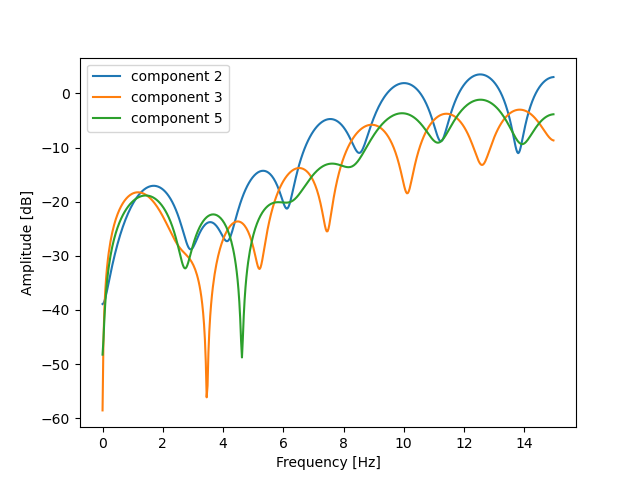

In [37]:
filter_idx = [1,2,4]
plt.close()
for i in filter_idx:
    w, h = signal.freqz(b=Ws_norm[:,i], a=1)
    x = w * fs * 1.0 / (2 * np.pi)
    y = 20 * np.log10(abs(h))
    plt.plot(x, y, label='component %d' % (i+1))
# w_diff, h_diff = signal.freqz(b=[1,-1], a=1)
# y_diff = 20 * np.log10(abs(h_diff))
# plt.plot(x, y_diff, label='1st-order diff')
plt.legend()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [Hz]')
plt.show()

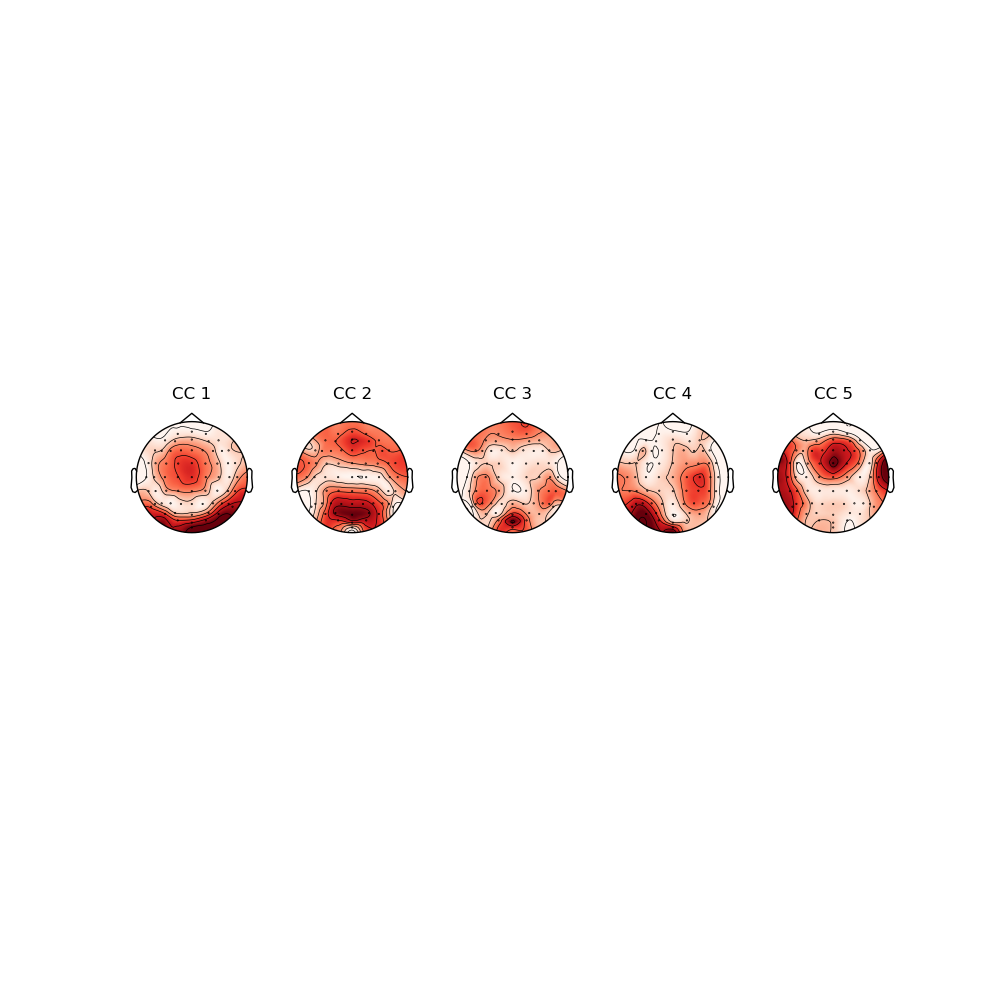

In [38]:
# Visualization: spatial (temporal) filter
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')
plt.close()
plt.figure(figsize=(10, 10))
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    mne.viz.plot_topomap(np.abs(F_train[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
    ax.set_title('CC '+str(i+1))
plt.show()

## Visualization for components across each fold

In [ ]:
# CCA
n_components = 5
fold = 10
id_sub = 10
eeg_onesub_list = [eeg[:,:,id_sub-1] for eeg in eeg_multisub_list]
eeg_onesub = np.concatenate(eeg_onesub_list, axis=0)
mag_avg_list = [feats[:,8] for feats in features_list]
L_EEG = 3 # correlations can be higher if include time lags
L_feat = int(fs/2)
offsetx = 1
offsety = 0
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')

Lam = np.zeros((fold, n_components))
corr_train = np.zeros((fold, n_components))
corr_test = np.zeros((fold, n_components))
plt.close()
fig, axes = plt.subplots(nrows=fold, ncols=n_components, figsize=(10, 25))
for idx in range(fold):
    EEG_train, EEG_test, Sti_train, Sti_test = utils.split_balance(eeg_onesub_list, mag_avg_list, fold=fold, fold_idx=idx+1)
    corr_train[idx,:], _, _, V_A_train, V_B_train, Lam[idx,:] = utils.cano_corr(EEG_train, Sti_train, L_EEG, L_feat, offsetx, offsety, n_components=n_components, regularization='lwcov', K_regu=None)
    corr_test[idx,:], _, _, _, _, _ = utils.cano_corr(EEG_test, Sti_test, L_EEG, L_feat, offsetx, offsety, n_components=n_components, regularization='lwcov', K_regu=None, V_A=V_A_train, V_B=V_B_train)
    forward_model = utils.forward_model(eeg_onesub, V_A_train, L_EEG, offsetx)
    for i in range(n_components):
        mne.viz.plot_topomap(np.abs(forward_model[:,i]), create_info, ch_type='eeg', axes=axes[idx,i], show=False)
        axes[idx,i].set_title("eigval: {eigval:.5f}\n train: {corrtrain:.5f}\n test: {corrtest:.5f}".format(eigval=Lam[idx,i], corrtrain=corr_train[idx,i], corrtest=corr_test[idx,i]))
rows = ['Fold {}'.format(row) for row in range(1, fold+1)]
for ax, row in zip(axes[:,0], rows):
    ax.set_ylabel(row, size='large')
fig.tight_layout()
plt.show()
# plt.savefig('figures/CCA_comp_'+str(id_sub)+'.png')

In [ ]:
# CCA-eigenvalues
n_components = 10
fold = 10
id_sub = 3
eeg_onesub = eeg_multisub_concat[:,:,id_sub-1]
eeg_onesub_list = [eeg[:,:,id_sub-1] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
L_EEG = 3 # correlations can be higher if include time lags
L_feat = int(fs/2)
causalx = False
causaly = True
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')

Lam = np.zeros((fold, n_components))
corr_train = np.zeros((fold, n_components))
corr_test = np.zeros((fold, n_components))
plt.close()
ax_eig = plt.subplot(1, 3, 1)
ax_eig.set_xlabel('order of components')
ax_eig.set_ylabel('eigenvalues')
ax_train = plt.subplot(1, 3, 2)
ax_train.set_xlabel('order of components')
ax_train.set_ylabel('corr_train')
ax_test = plt.subplot(1, 3, 3)
ax_test.set_xlabel('order of components')
ax_test.set_ylabel('corr_test')
for idx in range(fold):
    EEG_train, EEG_test, Sti_train, Sti_test = utils.split_balance(eeg_onesub_list, mag_avg_list, fold=fold, fold_idx=idx+1)
    corr_train[idx,:], _, V_A_train, V_B_train, Lam[idx,:] = utils.cano_corr(EEG_train, Sti_train, Lx=L_EEG, Ly=L_feat, causalx=causalx, causaly=causaly, n_components=n_components, regularization='lwcov', K_regu=None)
    corr_test[idx,:], _, _, _, _ = utils.cano_corr(EEG_test, Sti_test, Lx=L_EEG, Ly=L_feat, causalx=causalx, causaly=causaly, n_components=n_components, regularization='lwcov', K_regu=None, V_A=V_A_train, V_B=V_B_train)
    forward_model = utils.forward_model(eeg_onesub, V_A_train, L_EEG, causalx)
    ax_eig.plot(range(1, n_components+1), Lam[idx,:])
    ax_train.plot(range(1, n_components+1), corr_train[idx,:])
    ax_test.plot(range(1, n_components+1), corr_test[idx,:])
plt.tight_layout()
plt.show()

In [ ]:
# GCCA-x subjects
n_components = 5
fold = 10
eeg_sub_list = [eeg[:,:,0:10] for eeg in eeg_multisub_list]
L = 5
offset = 2
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')

Lam = np.zeros((fold, n_components))
corr_train = np.zeros((fold, n_components))
corr_test = np.zeros((fold, n_components))
plt.close()
fig, axes = plt.subplots(nrows=fold, ncols=n_components, figsize=(10, 25))
for idx in range(fold):
    train_list, test_list = utils.split_mm_balance([eeg_sub_list], fold=fold, fold_idx=idx+1)
    W_train, F_train, Lam[idx,:] = utils.GCCA(train_list[0], L, offset, n_components=n_components, regularization='lwcov')
    corr_train[idx,:], _, _ = utils.avg_corr_coe(train_list[0], W_train, L, offset, n_components=n_components)
    corr_test[idx,:], _, _ = utils.avg_corr_coe(test_list[0], W_train, L, offset, n_components=n_components)
    for i in range(n_components):
        mne.viz.plot_topomap(np.abs(F_train[:,i]), create_info, ch_type='eeg', axes=axes[idx,i], show=False)
        axes[idx,i].set_title("eigval: {eigval:.5f}\n train: {corrtrain:.5f}\n test: {corrtest:.5f}".format(eigval=Lam[idx,i], corrtrain=corr_train[idx,i], corrtest=corr_test[idx,i]))
rows = ['Fold {}'.format(row) for row in range(1, fold+1)]
for ax, row in zip(axes[:,0], rows):
    ax.set_ylabel(row, size='large')
fig.tight_layout()
plt.show()
plt.savefig('figures/GCCA_comp_10'+'.png')

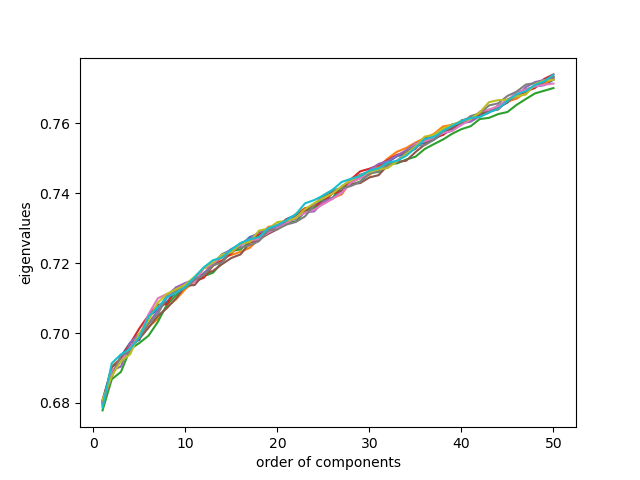

In [59]:
# GCCA-eigenvalues-5 subjects
n_components = 50
fold = 10
eeg_sub_list = [eeg[:,:,0:8] for eeg in eeg_multisub_list]
L = 3
causal = False
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')

Lam = np.zeros((fold, n_components))
corr_train = np.zeros((fold, n_components))
corr_test = np.zeros((fold, n_components))
plt.close()
for idx in range(fold):
    train_list, test_list = utils.split_mm_balance([eeg_sub_list], fold=fold, fold_idx=idx+1)
    _, _, Lam[idx,:]  = utils.GCCA(train_list[0], L, causal, n_components=n_components, regularization='lwcov')
    plt.plot(range(1,n_components+1), Lam[idx,:])
plt.xlabel('order of components')
plt.ylabel('eigenvalues')
plt.show()
plt.savefig('figures/GCCA_8_eigval.png')

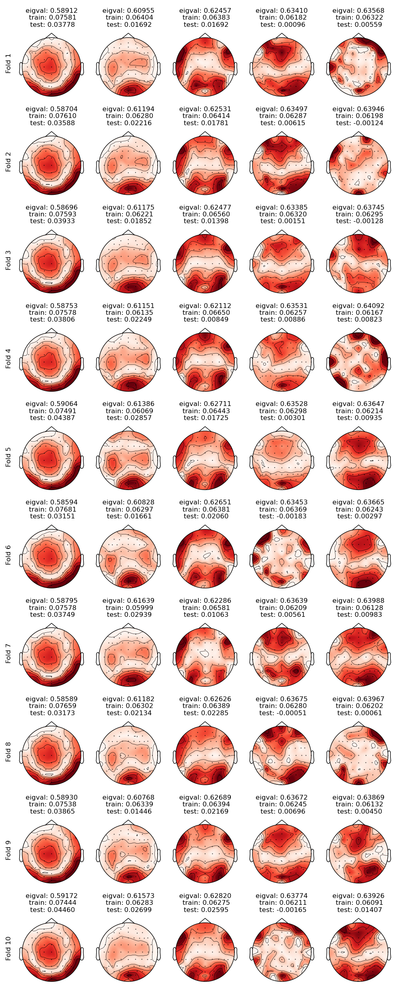

In [129]:
# SI-GCCA-7 subjects
n_components = 5
fold = 10
eeg_sub_list = [eeg[:,:,0:10] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
nested_datalist = [eeg_sub_list, mag_avg_list]
Llist = [5, int(fs/2)]
causal_list = [2, 0]
rho = 1
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')

Lam = np.zeros((fold, n_components))
corr_train = np.zeros((fold, n_components))
corr_test = np.zeros((fold, n_components))
plt.close()
fig, axes = plt.subplots(nrows=fold, ncols=n_components, figsize=(10, 25))
for idx in range(fold):
    train_list, test_list = utils.split_mm_balance(nested_datalist, fold=fold, fold_idx=idx+1)
    Wlist_train, F_train, Lam[idx,:] = utils.SI_GCCA(train_list, Llist, causal_list, n_components=n_components, rho=rho, regularization='lwcov')
    corr_train[idx,:], _, _  = utils.avg_corr_coe_multi_modal(train_list, Wlist_train, Llist, causal_list, n_components=n_components, ISC=True)
    corr_test[idx,:], _, _  = utils.avg_corr_coe_multi_modal(test_list, Wlist_train, Llist, causal_list, n_components=n_components, ISC=True)
    for i in range(n_components):
        mne.viz.plot_topomap(np.abs(F_train[:,i]), create_info, ch_type='eeg', axes=axes[idx, i], show=False)
        axes[idx, i].set_title("eigval: {eigval:.5f}\n train: {corrtrain:.5f}\n test: {corrtest:.5f}".format(eigval=Lam[idx,i], corrtrain=corr_train[idx,i], corrtest=corr_test[idx,i]))
rows = ['Fold {}'.format(row) for row in range(1, fold+1)]
for ax, row in zip(axes[:,0], rows):
    ax.set_ylabel(row, size='large')
fig.tight_layout()
plt.show()
plt.savefig('figures/SI_GCCA_10_comp.png')

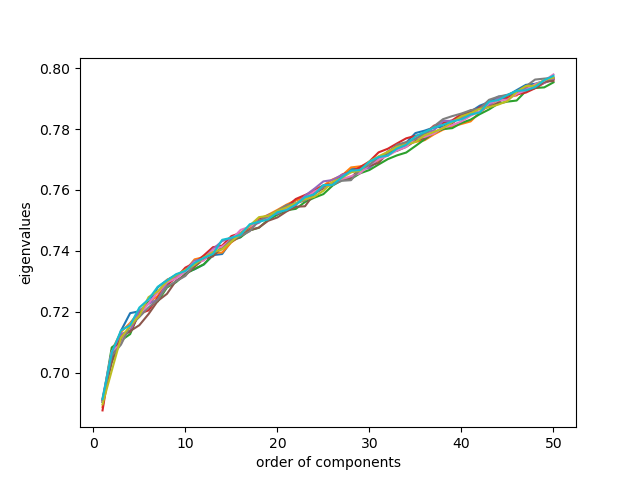

In [16]:
# SI-GCCA-5 subjects-eigenvalues
n_components = 50
fold = 10
eeg_sub_list = [eeg[:,:,0:7] for eeg in eeg_multisub_list]
mag_avg_list = [feats[:,8] for feats in features_list]
nested_datalist = [eeg_sub_list, mag_avg_list]
Llist = [3, int(fs/2)]
causal_list = [False, True]
rho = 1
biosemi_layout = mne.channels.read_layout('biosemi')
create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
create_info.set_montage('biosemi64')

Lam = np.zeros((fold, n_components))
corr_train = np.zeros((fold, n_components))
corr_test = np.zeros((fold, n_components))
plt.close()
for idx in range(fold):
    train_list, test_list = utils.split_mm_balance(nested_datalist, fold=fold, fold_idx=idx+1)
    _, _, Lam[idx,:] = utils.SI_GCCA(train_list, Llist, causal_list, n_components=n_components, rho=rho, regularization='lwcov')
    plt.plot(range(1,n_components+1), Lam[idx,:])
plt.xlabel('order of components')
plt.ylabel('eigenvalues')
plt.show()
plt.savefig('figures/SI_GCCA_7_eigval.png')

In [ ]:
# GCCA_multi_mod-5 subjects
# n_components = 5
# fold = 10
# mag_avg_list = [feats[:,8] for feats in features_list]
# nested_datalist = [eeg_multisub_list, mag_avg_list]
# Llist = [3, int(fs/2)]
# causal_list = [False, True]
# rhos = [1, 1]
# biosemi_layout = mne.channels.read_layout('biosemi')
# create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
# create_info.set_montage('biosemi64')

# Lam = np.zeros((fold, n_components))
# corr_train = np.zeros((fold, n_components))
# corr_test = np.zeros((fold, n_components))
# plt.close()
# for idx in range(fold):
#     train_list, test_list = utils.split_mm_balance(nested_datalist, fold=fold, fold_idx=idx+1)
#     Wlist_train, Flist_train, Lam[idx,:] = utils.GCCA_multi_modal(train_list, Llist, causal_list, n_components=n_components, rhos=rhos, regularization='lwcov')
#     corr_train[idx,:] = utils.avg_corr_coe_multi_modal(train_list, Wlist_train, Llist, causal_list, n_components=n_components, ISC=True)
#     corr_test[idx,:] = utils.avg_corr_coe_multi_modal(test_list, Wlist_train, Llist, causal_list, n_components=n_components, ISC=True)
#     forward = utils.F_organize(Flist_train[0], L=3, causal=False, avg=True)
#     for i in range(5):
#         ax = plt.subplot(fold, n_components, idx*n_components + i + 1)
#         mne.viz.plot_topomap(np.abs(forward[:,i]), create_info, ch_type='eeg', axes=ax, show=False)
#         ax.set_title("eigval: {eigval:.5f}\n train: {corrtrain:.5f}\n test: {corrtest:.5f}".format(eigval=Lam[idx,i], corrtrain=corr_train[idx,i], corrtest=corr_test[idx,i]))
# plt.show()

In [ ]:
# GCCA_multi_mod-5 subjects-eigenvalues
# n_components = 50
# fold = 10
# mag_avg_list = [feats[:,8] for feats in features_list]
# nested_datalist = [eeg_multisub_list, mag_avg_list]
# Llist = [3, int(fs/2)]
# causal_list = [False, True]
# rhos = [1, 1]
# biosemi_layout = mne.channels.read_layout('biosemi')
# create_info = mne.create_info(biosemi_layout.names, ch_types='eeg', sfreq=30)
# create_info.set_montage('biosemi64')

# Lam = np.zeros((fold, n_components))
# corr_train = np.zeros((fold, n_components))
# corr_test = np.zeros((fold, n_components))
# plt.close()
# for idx in range(fold):
#     train_list, test_list = utils.split_mm_balance(nested_datalist, fold=fold, fold_idx=idx+1)
#     Wlist_train, Flist_train, Lam[idx,:]  = utils.GCCA_multi_modal(train_list, Llist, causal_list, n_components=n_components, rhos=rhos, regularization='lwcov')
#     corr_train[idx,:] = utils.avg_corr_coe_multi_modal(train_list, Wlist_train, Llist, causal_list, n_components=n_components, ISC=True)
#     corr_test[idx,:] = utils.avg_corr_coe_multi_modal(test_list, Wlist_train, Llist, causal_list, n_components=n_components, ISC=True)
#     forward = utils.F_organize(Flist_train[0], L=3, causal=False, avg=True)
#     plt.plot(range(1,n_components+1), Lam[idx,:])
# plt.xlabel('order of components')
# plt.ylabel('eigenvalues')
# plt.show()